In [56]:
%reload_ext autoreload
%autoreload 2
import function as func
from ellipsoid_mirror import *
from read_simulation import *
np.set_printoptions(threshold=20)

plt.rcParams['font.size'] = 18
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

# General setting

In [57]:
freq = 20*GHz 
wavelength = calc_wavelength(freq)

# Setup calculation

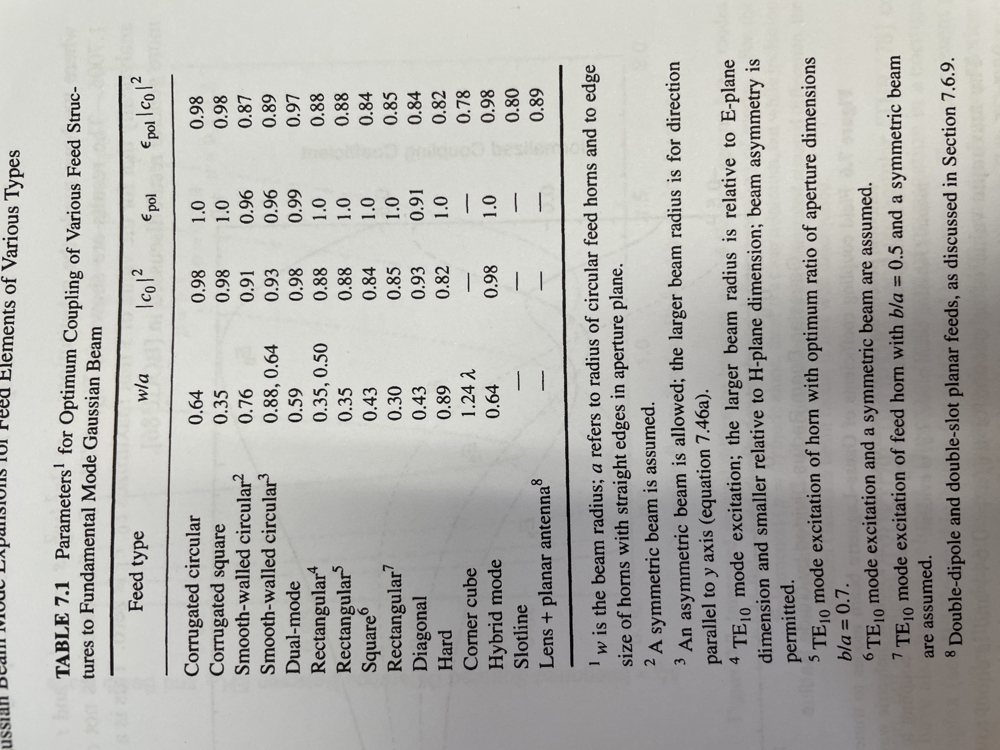

In [58]:
from IPython.display import Image
Image('Goldsmith_table7.1.JPG', width=400)

In [59]:
def calc_antenna_parameters(
    antenna_a,  # waveguid short edge (E-plane)
    antenna_b,  # waveguid long edge (H-plane)
    antenna_L,  # taper section length
    antenna_taper, # taper angle [rad]
    antenna_w_over_A = 0.50, # w/A at aperture in E-plane
    antenna_w_over_B = 0.35, # w/B at aperture in H-plane
    # from P. F. Goldsmith table 7.1 
    # rectangular^5: H-plane = 0.35
    #                           E-plane = 0.50
    verbose = 1,
    ):
    
    if antenna_w_over_B is None:
        antenna_w_over_B = antenna_w_over_A
        pass
    antenna_A = antenna_a + 2. * antenna_L * np.tan(antenna_taper)
    antenna_B = antenna_b + 2. * antenna_L * np.tan(antenna_taper)
    antenna_Ra = antenna_A/2. / np.sin(antenna_taper)
    antenna_Rb = antenna_B/2. / np.sin(antenna_taper)

    # Beam waist
    antenna_wA = antenna_w_over_A * antenna_A
    antenna_wB = antenna_w_over_B * antenna_B
    antenna_w0A = calc_beamwaist0(w=antenna_wA, R=antenna_Ra, wavelength=wavelength)
    antenna_w0B = calc_beamwaist0(w=antenna_wB, R=antenna_Rb, wavelength=wavelength)
    antenna_d0A = calc_waist_distance(w=antenna_wA, R=antenna_Ra, wavelength=wavelength)
    antenna_d0B = calc_waist_distance(w=antenna_wB, R=antenna_Rb, wavelength=wavelength)
    antenna_L0A = antenna_L - antenna_d0A
    antenna_L0B = antenna_L - antenna_d0B

    # Check
    if verbose > 0:
        print(f'a = {antenna_a/mm} mm')
        print(f'b = {antenna_b/mm} mm')
        print(f'A = {antenna_A/mm} mm')
        print(f'B = {antenna_B/mm} mm')
        print(f'Ra = {antenna_Ra/mm} mm')
        print(f'Rb = {antenna_Rb/mm} mm')
        print(f'A/B = {antenna_A/antenna_B}')
        print(f'w_A/A = {antenna_w_over_A}')
        print(f'w_B/B = {antenna_w_over_B}')
        print(f'beam waist in A = {antenna_w0A/mm} mm')
        print(f'beam waist distance from aperture in A = -{antenna_d0A/mm} mm')
        print(f'beam waist distance from antenna bottom in A = {antenna_L0A/mm} mm')
        print(f'beam waist in B = {antenna_w0B/mm} mm')
        print(f'beam waist distance from aperture in B = -{antenna_d0B/mm} mm')
        print(f'beam waist distance from antenna bottom in B = {antenna_L0B/mm} mm')
        print(f'antenna taper angle in A = {np.rad2deg( np.arcsin(antenna_A/2./antenna_Ra) )} deg')
        print(f'antenna taper angle in B = {np.rad2deg( np.arcsin(antenna_B/2./antenna_Rb) )} deg')
        pass
    
    antenna_pars = {
        'L': antenna_L,
        'taper':antenna_taper,
        'w_over_A': antenna_w_over_A, 
        'w_over_B': antenna_w_over_B, 
        
        'a': antenna_a, 
        'A': antenna_A, 
        'Ra': antenna_Ra, 
        'wA': antenna_wA, 
        'w0A': antenna_w0A, 
        'd0A': antenna_d0A, 
        'L0A': antenna_L0A, 
        
        'b': antenna_b, 
        'B': antenna_B, 
        'Rb': antenna_Rb, 
        'wB': antenna_wB, 
        'w0B': antenna_w0B, 
        'd0B': antenna_d0B, 
        'L0B': antenna_L0B, 
        }
    
    return antenna_pars


def calc_circular_antenna_parameters(
    antenna_r, # Radius in aperture
    antenna_L,  # taper section length
    antenna_taperA, # taper angle in E-plane
    antenna_taperB, # taper angle in H-plane
    antenna_w_over_A = 0.88, # w/A at aperture in E-plane
    antenna_w_over_B = 0.64, # w/B at aperture in H-plane
    # from P. F. Goldsmith table 7.1 
    # smooth-walled circular: E-plane = 0.88
    #                                          H-plane = 0.64
    verbose = 1,
    ):
    
    if antenna_w_over_B is None:
        antenna_w_over_B = antenna_w_over_A
        pass
    
    # Correct calculation (different from v4)
    antenna_rA = antenna_r
    antenna_rB = antenna_r
    antenna_Ra = antenna_rA / np.sin(antenna_taperA)
    antenna_Rb = antenna_rB / np.sin(antenna_taperB)
    antenna_wA = antenna_w_over_A * antenna_r
    antenna_wB = antenna_w_over_B * antenna_r
    
    antenna_w0A = calc_beamwaist0(w=antenna_wA, R=antenna_Ra, wavelength=wavelength)
    antenna_w0B = calc_beamwaist0(w=antenna_wB, R=antenna_Rb, wavelength=wavelength)
    antenna_d0A = calc_waist_distance(w=antenna_wA, R=antenna_Ra, wavelength=wavelength)
    antenna_d0B = calc_waist_distance(w=antenna_wB, R=antenna_Rb, wavelength=wavelength)
    antenna_L0A = antenna_L - antenna_d0A
    antenna_L0B = antenna_L - antenna_d0B

    # Check
    if verbose > 0:
        print(f'rA = {antenna_rA/mm} mm')
        print(f'rB = {antenna_rB/mm} mm')
        print(f'Ra = {antenna_Ra/mm} mm')
        print(f'Rb = {antenna_Rb/mm} mm')
        print(f'w_A/A = {antenna_w_over_A}')
        print(f'w_B/B = {antenna_w_over_B}')
        print(f'beam waist in A = {antenna_w0A/mm} mm')
        print(f'beam waist distance from aperture in A = -{antenna_d0A/mm} mm')
        print(f'beam waist distance from antenna bottom in A = {antenna_L0A/mm} mm')
        print(f'beam waist in B = {antenna_w0B/mm} mm')
        print(f'beam waist distance from aperture in B = -{antenna_d0B/mm} mm')
        print(f'beam waist distance from antenna bottom in B = {antenna_L0B/mm} mm')
        print(f'antenna taper angle in A = {np.rad2deg( np.arcsin(antenna_rA/antenna_Ra) )} deg')
        print(f'antenna taper angle in B = {np.rad2deg( np.arcsin(antenna_rB/antenna_Rb) )} deg')
        pass
    
    antenna_pars = {
        'L': antenna_L,
        'taper':antenna_taper,
        'w_over_A': antenna_w_over_A, 
        'w_over_B': antenna_w_over_B, 
        
        'rA': antenna_rA, 
        'Ra': antenna_Ra, 
        'wA': antenna_wA, 
        'w0A': antenna_w0A, 
        'd0A': antenna_d0A, 
        'L0A': antenna_L0A, 
        
        'rB': antenna_rB, 
        'Rb': antenna_Rb, 
        'wB': antenna_wB, 
        'w0B': antenna_w0B, 
        'd0B': antenna_d0B, 
        'L0B': antenna_L0B, 
        }
    
    return antenna_pars

## Circuar Horn antenna

In [60]:
antenna_r0 = 6.35*mm
antenna_r1 = 12.7*mm
antenna_L = 50.8*mm
antenna_taper = np.arctan( (antenna_r1 - antenna_r0)/antenna_L )
print(f'taper = {np.rad2deg(antenna_taper)} deg')
antenna_pars = calc_circular_antenna_parameters(
    antenna_r=antenna_r1,
    antenna_taperA = antenna_taper, 
    antenna_taperB = antenna_taper, 
    antenna_L=antenna_L, 
    antenna_w_over_A = 0.88, # smooth-walled  circular E-plane
    antenna_w_over_B = 0.64, # smooth-walled circular H-plane
)

w0 = antenna_pars['w0A'] # beam waist in E-plane
w0H = antenna_pars['w0B'] # beam waist in H-plane
d_waist = antenna_pars['d0A'] # distance from waist to aperture
L_waist = antenna_pars['L0A'] # distance from antenna bottom to beam waist
d_waistH = antenna_pars['d0B'] # distance from waist to aperture
L_waistH = antenna_pars['L0B'] # distance from antenna bottom to beam waist
print(f'w0 = {w0/mm} mm')
print(f'd_waist = {d_waist/mm} mm')
print(f'L_waist = {L_waist/mm} mm')
print(f'w0 in H-plane = {w0H/mm} mm')
print(f'd_waist in H-plane = {d_waistH/mm} mm')
print(f'L_waist in H-plane = {L_waistH/mm} mm')

taper = 7.125016348901798 deg
rA = 12.7 mm
rB = 12.7 mm
Ra = 102.39067340339159 mm
Rb = 102.39067340339159 mm
w_A/A = 0.88
w_B/B = 0.64
beam waist in A = 10.8277257422392 mm
beam waist distance from aperture in A = -6.282105298178358 mm
beam waist distance from antenna bottom in A = 44.51789470182164 mm
beam waist in B = 8.054687329101537 mm
beam waist distance from aperture in B = -1.838750036281387 mm
beam waist distance from antenna bottom in B = 48.96124996371861 mm
antenna taper angle in A = 7.125016348901797 deg
antenna taper angle in B = 7.125016348901797 deg
w0 = 10.8277257422392 mm
d_waist = 6.282105298178358 mm
L_waist = 44.51789470182164 mm
w0 in H-plane = 8.054687329101537 mm
d_waist in H-plane = 1.838750036281387 mm
L_waist in H-plane = 48.96124996371861 mm


## Distance between antenna and parabolic mirror

In [137]:
beamsize_mirror = 250*mm/2.

def calc_mirror_distance(
    w0, L, d_waist,
    beamsize_mirror = 250*mm/2.,
):
    
    z_mirror = calc_distance_from_beamsize(w=beamsize_mirror, w0=w0, wavelength=wavelength)
    d_mirror = z_mirror - np.abs(d_waist)
    R_mirror = calc_R(z=z_mirror, w0=w0, wavelength=wavelength)
    L_waist = L - d_waist

    print(f'beamsize (w) @ mirror = {beamsize_mirror/mm} mm')
    print(f'distance from antenna aperture = {d_mirror/mm} mm')
    print(f'z from beamwaist @ mirror = {z_mirror/mm} mm')
    print(f'R @ mirror = {R_mirror/mm} mm')
    print()
    print(f'f = {R_mirror/2./mm} mm')
    print(f'L = {(L)/mm} mm')
    print(f'L_waist = {L_waist/mm} mm')
    print(f'Mirror distance from antenna bottom = {(d_mirror + L)/mm} mm')

    return beamsize_mirror, \
            w0, z_mirror, d_mirror, R_mirror, L_waist

beamsize_mirror, tmp, z_mirror, d_mirror, R_mirror, L_waist = \
calc_mirror_distance(
    beamsize_mirror = beamsize_mirror,
    w0 = w0,
    L = antenna_L,
    d_waist = d_waist
)

beamsize (w) @ mirror = 125.0 mm
distance from antenna aperture = 276.3171108498388 mm
z from beamwaist @ mirror = 282.59921614801715 mm
R @ mirror = 284.7356840162715 mm

f = 142.36784200813574 mm
L = 50.8 mm
L_waist = 44.51789470182164 mm
Mirror distance from antenna bottom = 327.1171108498388 mm


# Simulation Expectation

## Mirror Configurations

In [62]:
f_mirror = 140.37*mm # focal distance setup in the CST simulation
R_mirror = 2 * f_mirror
z_mirror = 282.60*mm # mirror distance from beam waist at the antenna
w_mirror = calc_beamwaist(w0=w0, z=z_mirror, wavelength=wavelength) # beam size (radius) @ mirror
L_waist = 44.517*mm # distance between the beam waist and antenna bottom (boundary betweeen waveguide and taper sections)
D_mirror = 1000*mm # diameter of the mirror
slant_angle = np.deg2rad(90.)

print(f'Beam waist @ antenna   w0 = {w0/mm:.3f} mm')
print(f'z @ mirror              z = {z_mirror/mm:.3f} mm')
print(f'beam size @ mirror      w = {w_mirror/mm:.3f} mm')
print(f'Focal distance          f = {f_mirror/mm} mm')
print(f'Curvature of the mirror R = {R_mirror/mm} mm')
print(f'Slant angle               = {np.rad2deg(slant_angle):.0f} deg')

# H-plane calculation
#  z is distance from the beam waist in H-plane
zH_mirror = z_mirror - L_waist + L_waistH
#  beaisize in H-plane at zH_mirror
wH_mirror = calc_beamwaist(w0=w0H, z=zH_mirror, wavelength=wavelength )
print(f'--- H-plane ---')
print(f'Beam size @ mirror in H-plane w = {wH_mirror/mm:.3f} mm')
print(f'z @ mirror in H-plane         z = {zH_mirror/mm:.3f} mm')

Beam waist @ antenna   w0 = 10.828 mm
z @ mirror              z = 282.600 mm
beam size @ mirror      w = 125.000 mm
Focal distance          f = 140.37 mm
Curvature of the mirror R = 280.74 mm
Slant angle               = 90 deg
--- H-plane ---
Beam size @ mirror in H-plane w = 170.227 mm
z @ mirror in H-plane         z = 287.044 mm


## Beam between Antenna and Mirror

z_antenna_list        = [  0.  10.  20. ... 970. 980. 990.] mm
beamsize_antenna_list = [ 10.82772574  11.69007119  13.96109322 ... 427.57727782 431.98247865
 436.38770773] mm
R_antenna_list        = [         inf  70.37641449  50.18820724 ... 970.62243726 980.61608586
 990.60986277] mm


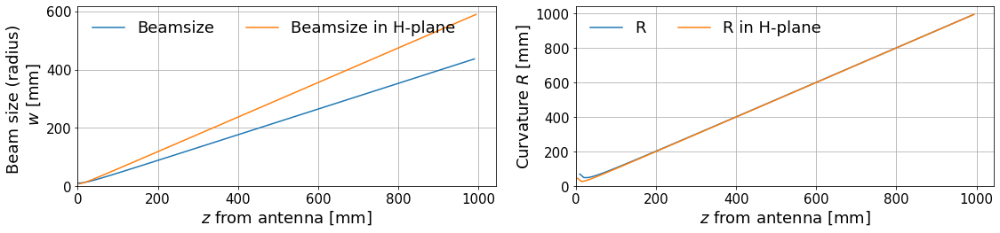

In [63]:
_dz = 10*mm
z_antenna_list = np.arange(0*mm, 1, _dz)  # z position from reflection
beamsize_antenna_list = calc_beamwaist(z=z_antenna_list, w0=w0, wavelength=wavelength)
R_antenna_list = calc_R(z=z_antenna_list, w0=w0, wavelength=wavelength)
zH_antenna_list = np.arange(0*mm, 1, _dz) - L_waist + L_waistH  # z position from reflection
beamsizeH_antenna_list = calc_beamwaist(z=zH_antenna_list, w0=w0H, wavelength=wavelength)
RH_antenna_list = calc_R(z=zH_antenna_list, w0=w0H, wavelength=wavelength)
print(f'z_antenna_list        = {z_antenna_list/mm} mm')
print(f'beamsize_antenna_list = {beamsize_antenna_list/mm} mm')
print(f'R_antenna_list        = {R_antenna_list/mm} mm')

fig, ax = plt.subplots(1, 2, figsize=(16,4))
_ax = ax[0]
_ax.plot(z_antenna_list/mm, beamsize_antenna_list/mm, label='Beamsize')
_ax.plot(zH_antenna_list/mm, beamsizeH_antenna_list/mm, label='Beamsize in H-plane')
_ax.set_xlabel('$z$ from antenna [mm]')
_ax.set_ylabel('Beam size (radius) \n $w$ [mm]')
_ax.legend(frameon=False, ncol=2)
_ax.grid(True)
_ax.set_xlim(left=0)
_ax.set_ylim(bottom=0)
_ax = ax[1]
_ax.plot(z_antenna_list/mm, R_antenna_list/mm, label='R')
_ax.plot(zH_antenna_list/mm, RH_antenna_list/mm, label='R in H-plane')
_ax.set_xlabel('$z$ from antenna [mm]')
_ax.set_ylabel('Curvature $R$ [mm]')
_ax.legend(frameon=False, ncol=2)
_ax.grid(True)
_ax.set_xlim(left=0)
_ax.set_ylim(bottom=0)

fig.tight_layout()
#ax.set_xlim([0, 200])
#ax.set_ylim([0, 200])

## Beam after mirror

In [64]:
height_after_ref = 2*f_mirror / np.sin(slant_angle) * np.abs(np.cos(slant_angle) - 1.)
print(f'height after reflection = {height_after_ref/mm} mm')

height after reflection = 280.73999999999995 mm


In [65]:
z_mirror_list = np.arange(0*mm, 2000*mm+_dz, _dz)  # z position from reflection
beamsize_mirror_list = calc_beamwaist(z=z_mirror_list, w0=w_mirror, wavelength=wavelength)
beamsizeH_mirror_list = calc_beamwaist(z=z_mirror_list, w0=wH_mirror, wavelength=wavelength)
print(f'z_mirror_list (after mirror) = {z_mirror_list/mm} mm')
print(f'beamsize_mirror_list (after mirror) = {beamsize_mirror_list/mm} mm')

z_mirror_list (after mirror) = [   0.   10.   20. ... 1980. 1990. 2000.] mm
beamsize_mirror_list (after mirror) = [125.00034411 125.00092691 125.00267528 ... 146.07225912 146.27011911
 146.46870657] mm


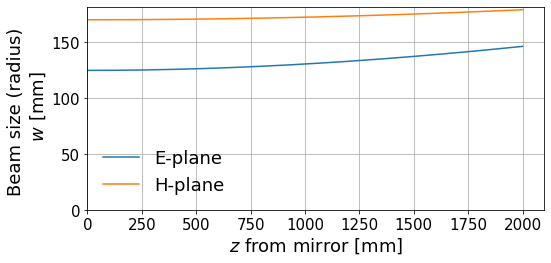

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.plot(z_mirror_list/mm, beamsize_mirror_list/mm, label='E-plane')
ax.plot(z_mirror_list/mm, beamsizeH_mirror_list/mm, label='H-plane')
ax.set_xlabel('$z$ from mirror [mm]')
ax.set_ylabel('Beam size (radius) \n $w$ [mm]')
ax.grid(True)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
ax.legend(frameon=False)
fig.tight_layout()

## Beam for all path

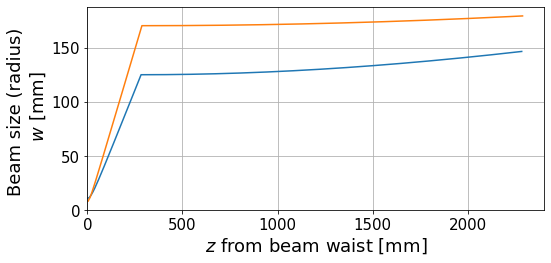

In [67]:
# E-plane
z_mirror_list_from_antenna = z_mirror_list + z_mirror
i_before_mirror = np.where( z_antenna_list < z_mirror)
z_list = np.hstack([z_antenna_list[i_before_mirror], z_mirror_list_from_antenna])
beamsize_list = np.hstack([beamsize_antenna_list[i_before_mirror], beamsize_mirror_list])
# H-plane
zH_mirror_list_from_antenna = z_mirror_list + zH_mirror
i_before_mirrorH = np.where( zH_antenna_list < zH_mirror)
zH_list = np.hstack([zH_antenna_list[i_before_mirrorH], zH_mirror_list_from_antenna])
beamsizeH_list = np.hstack([beamsizeH_antenna_list[i_before_mirrorH], beamsizeH_mirror_list])

fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.plot(z_list/mm, beamsize_list/mm, label='E-plane')
ax.plot(zH_list/mm, beamsizeH_list/mm, label='H-plane')
ax.set_xlabel('$z$ from beam waist [mm]')
ax.set_ylabel('Beam size (radius) \n $w$ [mm]')
ax.grid(True)
ax.set_ylim(bottom=0)
ax.set_xlim(left=0)
fig.tight_layout()

# Plot CST data

## v6-1 SP1 (for 2D inputs at U=0)
- Full simulation (Transient solver)

In [128]:
_indir = 'input/CST/20GHz_v6-1/SP1/'
_infile = 'E-field_abs_ave_w-v.txt'
_w_list_mm = np.arange(50, 550, 50)
_w_list= _w_list_mm * mm
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

print(_infile)
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)

E-field_abs_ave_w-v.txt
input file = input/CST/20GHz_v6-1/SP1//E-field_abs_ave_w-v.txt (type=3D_twovalue)


x_list (size=(501,)) = [  0.   1.   2. ... 498. 499. 500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
w = 50 mm
w = 100 mm
w = 150 mm
w = 200 mm
w = 250 mm
w = 300 mm
w = 350 mm
w = 400 mm
w = 450 mm
w = 500 mm


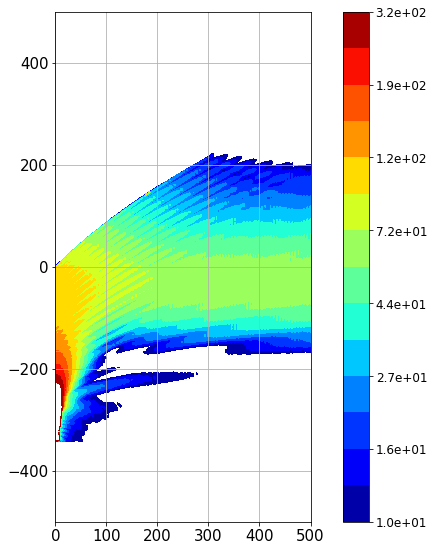

In [129]:
### Create slice data list ###
_slicedata_list = []
_newgrid = ( np.linspace(0, 500, 500+1), np.linspace(-500, 500, 500+1) )
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'y', 'val0'], logz=True, 
                     levels=np.power(10., np.linspace(10, 25, 15)/10), 
                     newgrid=_newgrid)
_data_grid['val0'] = _data_grid.pop('z') # key name change: z --> val0
_data_grid['val0'][np.isnan(_data_grid['val0'])] = 0.

for _w in _w_list_mm:
    print(f'w = {_w} mm')
    _slicedata_list.append( getSlice(_data_grid, 'x', _w) )
    pass

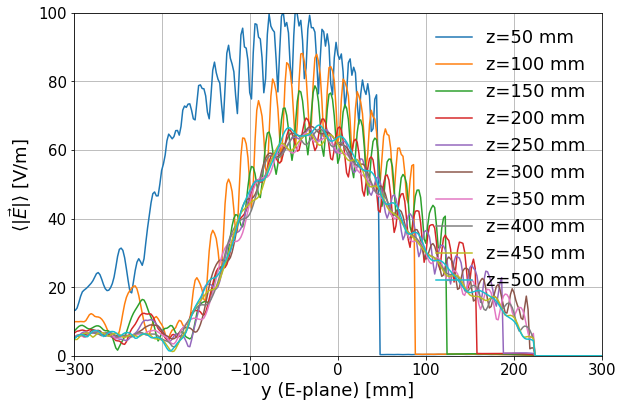

In [130]:
fig, ax = plt.subplots(1, 1, figsize=(9,6))
for _label, _data in zip(_label_list, _slicedata_list):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-300, 300])
ax.set_ylim([0, 100])
#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.legend(frameon=False)
ax.grid(True)
ax.set_xlabel('y (E-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()

x @ y max = -48.0
Beam size @ power = 1/e = 180.86 mm / 148.64 mm
x @ y max = -40.0
Beam size @ power = 1/e = 121.47 mm / 123.91 mm
x @ y max = -26.0
Beam size @ power = 1/e = 129.26 mm / 136.39 mm
x @ y max = -36.0
Beam size @ power = 1/e = 122.91 mm / 140.77 mm
x @ y max = -32.0
Beam size @ power = 1/e = 130.90 mm / 134.98 mm
x @ y max = -30.0
Beam size @ power = 1/e = 128.21 mm / 131.46 mm
x @ y max = -36.0
Beam size @ power = 1/e = 128.25 mm / 130.00 mm
x @ y max = -20.0
Beam size @ power = 1/e = 137.40 mm / 131.00 mm
x @ y max = -32.0
Beam size @ power = 1/e = 124.01 mm / 130.94 mm
x @ y max = -22.0
Beam size @ power = 1/e = 128.85 mm / 129.85 mm


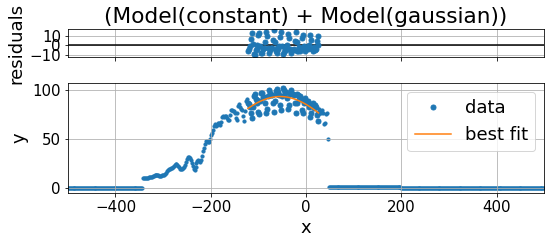

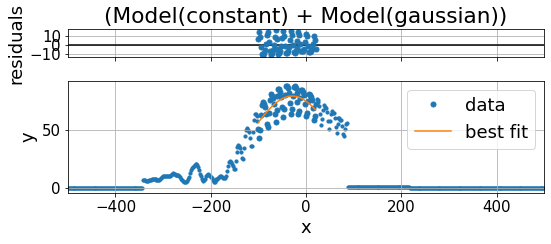

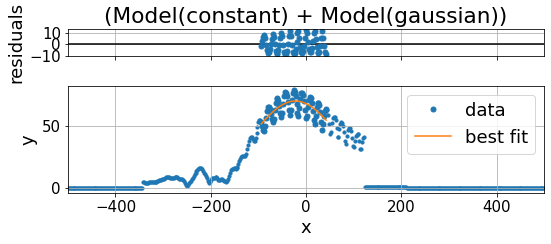

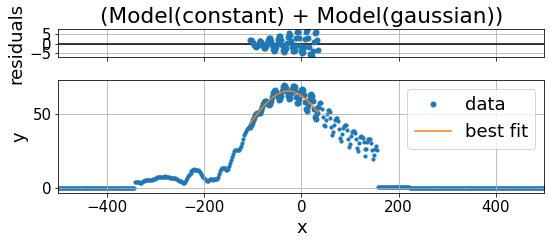

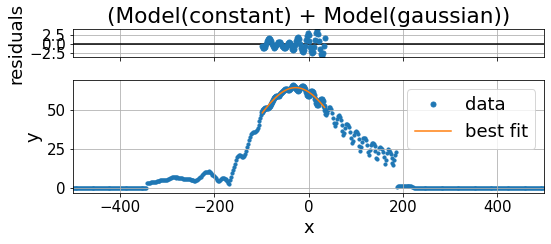

...

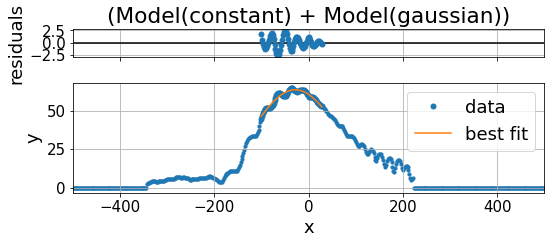

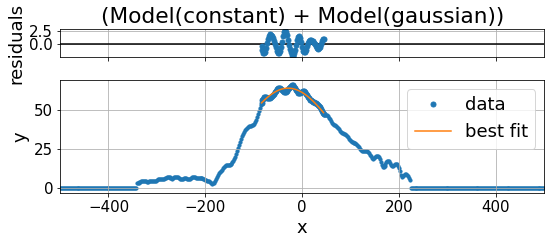

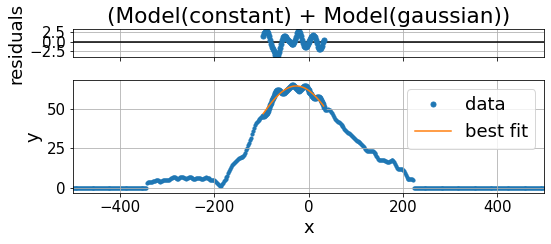

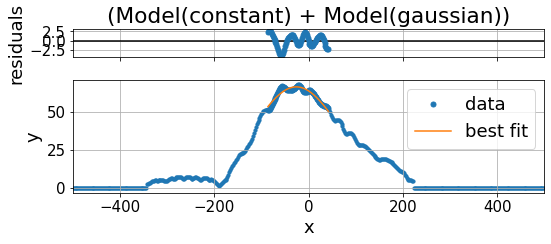

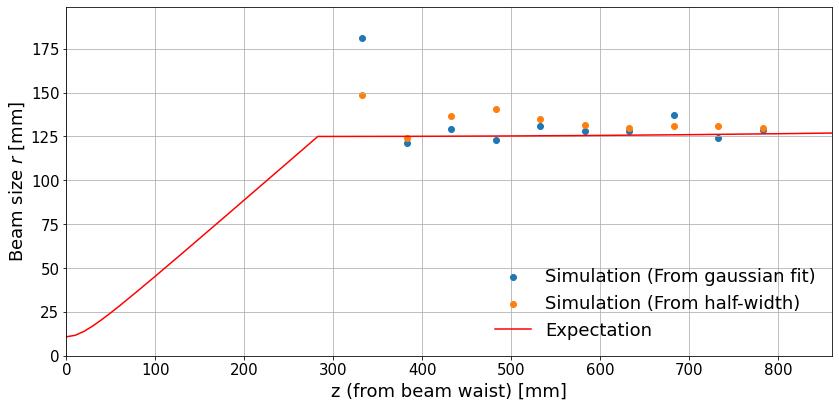

In [131]:
### Calculate beam size ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 20
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_ymax = np.where(_y==_ymax)
    _x_ymax = _x[_i_ymax][0]
    print(f'x @ y max = {_x_ymax}')
    #_range_scale = 1.0
    _range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_ymax-_fwhm_from_half*_range_scale, _x_ymax+_fwhm_from_half*_range_scale], xlim=[-D_mirror/mm/2, D_mirror/mm/2])
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass

#plt.scatter(_slicedata_list[-1]['y'], _slicedata_list[-1]['val0'])
#plt.xlim(-100, 50)
#plt.ylim(30, 45)

_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

### Draw beam size ###

# Temporary Expectation
#_z_tmp_list = z_antenna_list
#_beamsize_tmp_list = calc_beamwaist(z=_z_tmp_list+20*mm, w0=w0*1.0, wavelength=wavelength)
# Simulation
_z_list = _w_list + z_mirror

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(z_list/mm, beamsize_list/mm, label='Expectation', c='red')
#ax.plot(_z_tmp_list/mm, _beamsize_tmp_list/mm, label='Expectation (tmp)')
ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm)*1.1)
ax.set_ylim(bottom=0, top=max(_beamsize_list/mm)*1.1)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()

In [132]:
data_61SP1 = {'data_list':_data_list, 'slicedata_list':_slicedata_list, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

## v6-1 HS1 (for 2D inputs at U=0)
- Hybrid solver simulation (uni-directional)

E-field_abs_ave_w-v.txt
input file = input/CST/20GHz_v6-1/HS1_uni//E-field_abs_ave_w-v.txt (type=3D_twovalue)
x_list (size=(501,)) = [  0.   1.   2. ... 498. 499. 500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
w = 50 mm
w = 100 mm
w = 150 mm
w = 200 mm
w = 250 mm
w = 300 mm
w = 350 mm
w = 400 mm
w = 450 mm
w = 500 mm
x @ y max = -48.0
Beam size @ power = 1/e = 170.02 mm / 147.04 mm
x @ y max = -42.0
Beam size @ power = 1/e = 118.67 mm / 123.26 mm
x @ y max = -28.0
Beam size @ power = 1/e = 126.53 mm / 136.54 mm
x @ y max = -20.0
Beam size @ power = 1/e = 130.58 mm / 140.43 mm
x @ y max = -16.0
Beam size @ power = 1/e = 134.74 mm / 133.71 mm
x @ y max = -30.0
Beam size @ power = 1/e = 129.99 mm / 131.40 mm
x @ y max = -38.0
Beam size @ power = 1/e = 129.44 mm / 130.94 mm
x @ y max = -24.0
Beam size @ power = 1/e = 137.97 mm / 131.98 mm
x @ y max = -40.0
Beam size @ power = 1/e = 122.25 mm / 131.83 mm
x @ y max = -28.0
Beam size @ power = 1/e = 127.79 mm / 132.18 

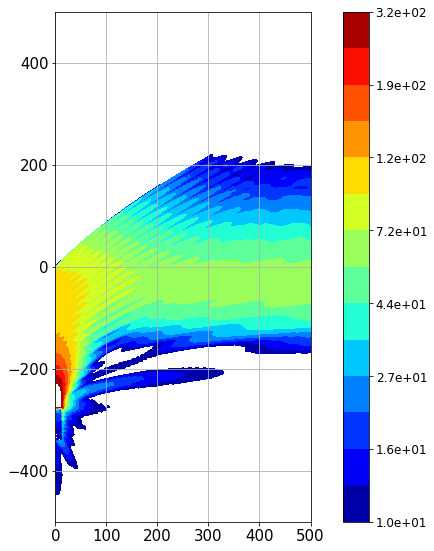

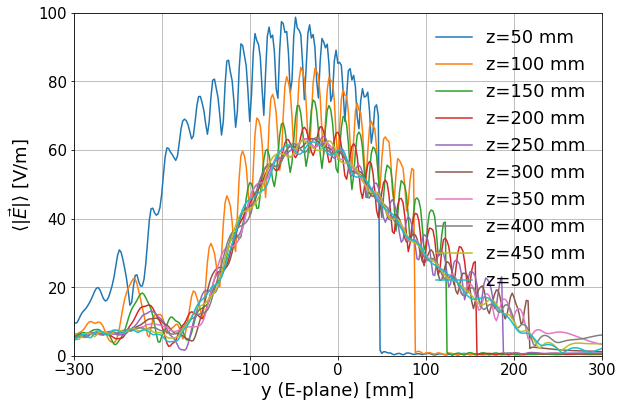

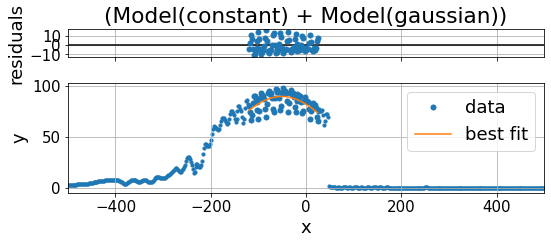

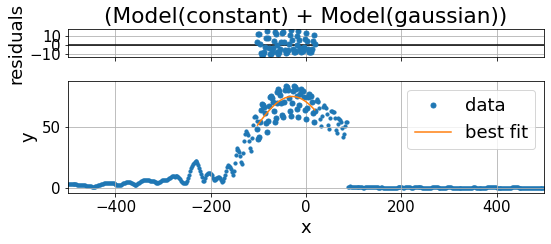

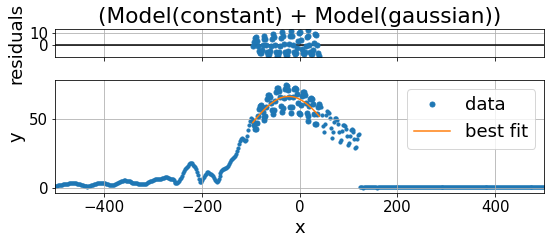

...

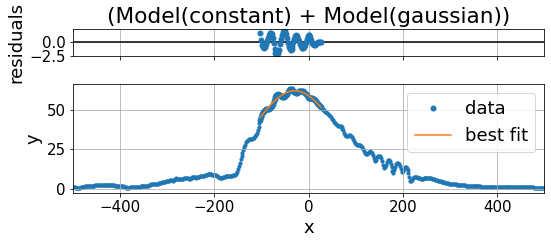

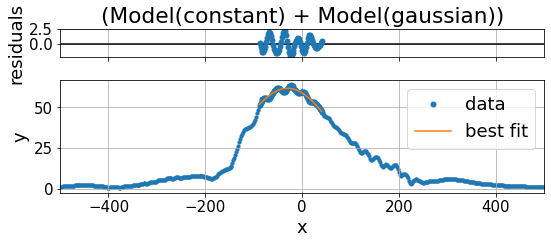

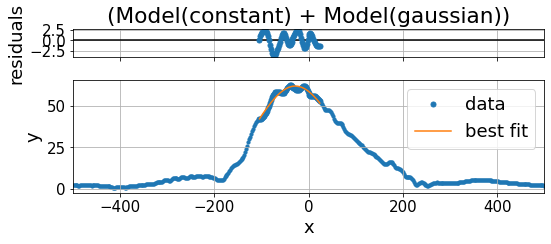

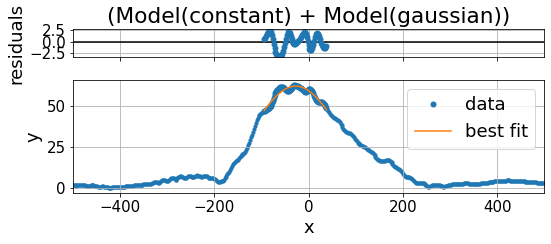

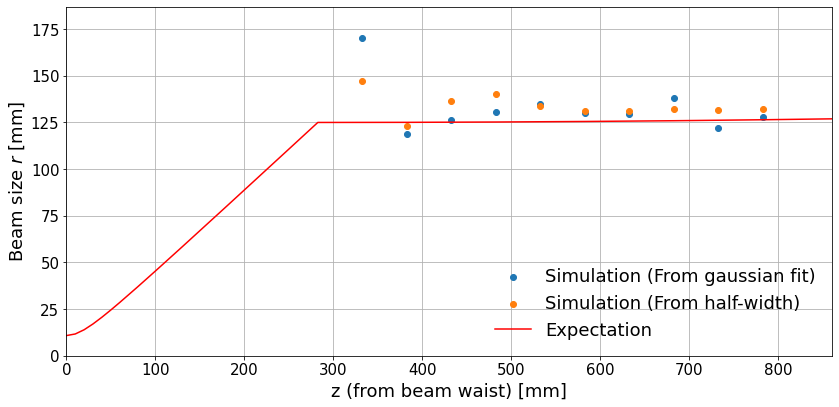

In [133]:
_indir = 'input/CST/20GHz_v6-1/HS1_uni/'
_infile = 'E-field_abs_ave_w-v.txt'
_w_list_mm = np.arange(50, 550, 50)
_w_list= _w_list_mm * mm
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

print(_infile)
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)

### Create slice data list ###
_slicedata_list = []
_newgrid = ( np.linspace(0, 500, 500+1), np.linspace(-500, 500, 500+1) )
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'y', 'val0'], logz=True, 
                     levels=np.power(10., np.linspace(10, 25, 15)/10), 
                     newgrid=_newgrid)
_data_grid['val0'] = _data_grid.pop('z') # key name change: z --> val0
_data_grid['val0'][np.isnan(_data_grid['val0'])] = 0.

for _w in _w_list_mm:
    print(f'w = {_w} mm')
    _slicedata_list.append( getSlice(_data_grid, 'x', _w) )
    pass

### Plot slice data ###
fig, ax = plt.subplots(1, 1, figsize=(9,6))
for _label, _data in zip(_label_list, _slicedata_list):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-300, 300])
ax.set_ylim([0, 100])
#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.legend(frameon=False)
ax.grid(True)
ax.set_xlabel('y (E-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()

### Calculate beam size ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 20
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_ymax = np.where(_y==_ymax)
    _x_ymax = _x[_i_ymax][0]
    print(f'x @ y max = {_x_ymax}')
    #_range_scale = 1.0
    _range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_ymax-_fwhm_from_half*_range_scale, _x_ymax+_fwhm_from_half*_range_scale], xlim=[-D_mirror/mm/2, D_mirror/mm/2])
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass

#plt.scatter(_slicedata_list[-1]['y'], _slicedata_list[-1]['val0'])
#plt.xlim(-100, 50)
#plt.ylim(30, 45)

_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

### Draw beam size ###

# Temporary Expectation
#_z_tmp_list = z_antenna_list
#_beamsize_tmp_list = calc_beamwaist(z=_z_tmp_list+20*mm, w0=w0*1.0, wavelength=wavelength)
# Simulation
_z_list = _w_list + z_mirror

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(z_list/mm, beamsize_list/mm, label='Expectation', c='red')
#ax.plot(_z_tmp_list/mm, _beamsize_tmp_list/mm, label='Expectation (tmp)')
ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm)*1.1)
ax.set_ylim(bottom=0, top=max(_beamsize_list/mm)*1.1)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()

## Store the data ##
data_61HS1 = {'data_list':_data_list, 'slicedata_list':_slicedata_list, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

## v6-1 HS2 (for 2D inputs at U=0)
- Hybrid solver simulation (bi-directional)

E-field_abs_ave_w-v.txt
input file = input/CST/20GHz_v6-1/HS2_bi//E-field_abs_ave_w-v.txt (type=3D_twovalue)
x_list (size=(501,)) = [  0.   1.   2. ... 498. 499. 500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
w = 50 mm
w = 100 mm
w = 150 mm
w = 200 mm
w = 250 mm
w = 300 mm
w = 350 mm
w = 400 mm
w = 450 mm
w = 500 mm
x @ y max = -48.0
Beam size @ power = 1/e = 196.85 mm / 153.36 mm
x @ y max = -42.0
Beam size @ power = 1/e = 125.40 mm / 125.22 mm
x @ y max = -28.0
Beam size @ power = 1/e = 125.12 mm / 136.66 mm
x @ y max = -18.0
Beam size @ power = 1/e = 134.81 mm / 148.14 mm
x @ y max = -16.0
Beam size @ power = 1/e = 132.20 mm / 137.43 mm
x @ y max = -36.0
Beam size @ power = 1/e = 126.27 mm / 134.70 mm
x @ y max = -20.0
Beam size @ power = 1/e = 130.78 mm / 134.59 mm
x @ y max = -26.0
Beam size @ power = 1/e = 133.89 mm / 134.69 mm
x @ y max = -12.0
Beam size @ power = 1/e = 140.25 mm / 134.91 mm
x @ y max = -30.0
Beam size @ power = 1/e = 127.18 mm / 135.05 m

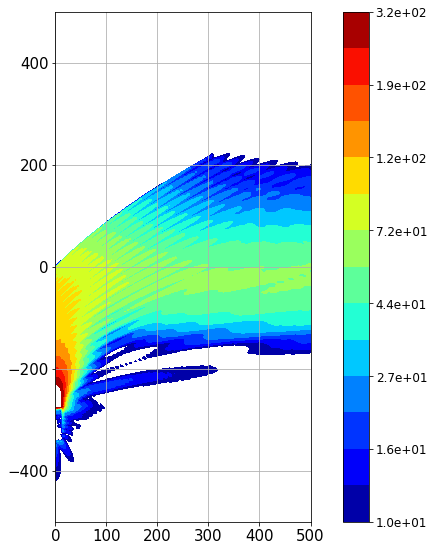

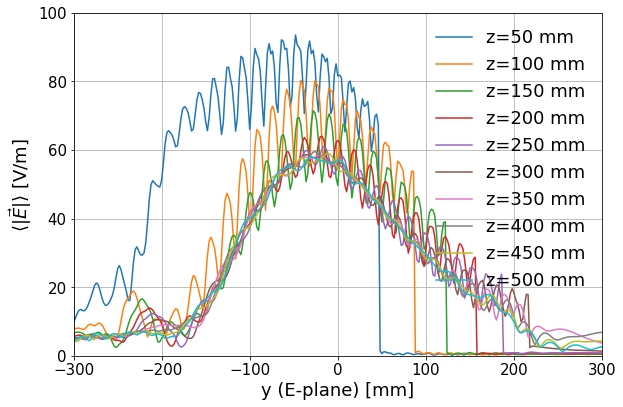

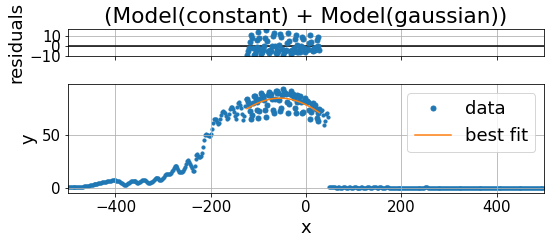

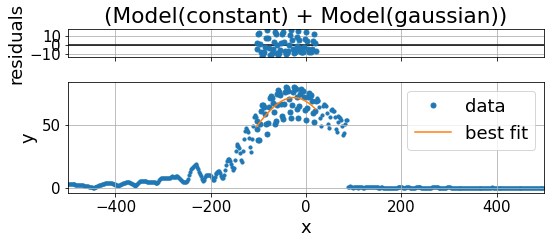

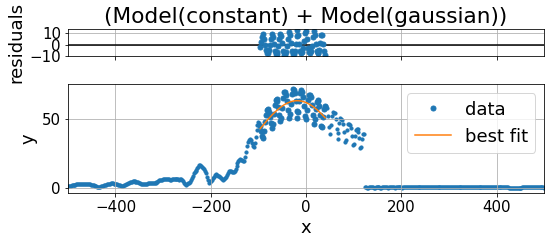

...

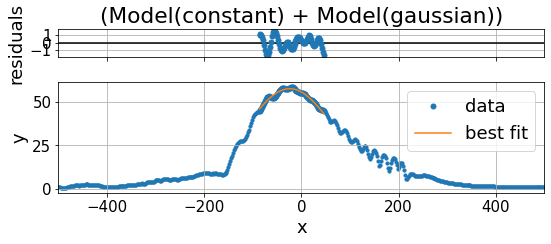

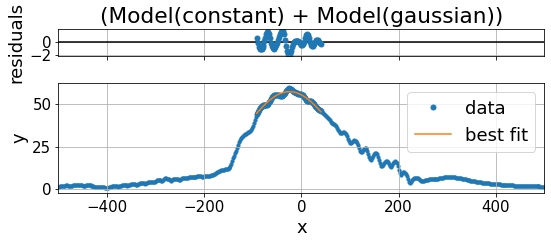

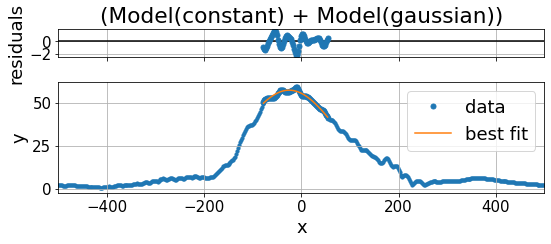

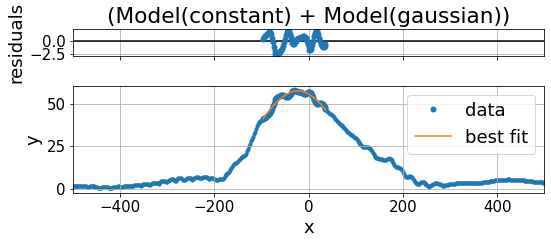

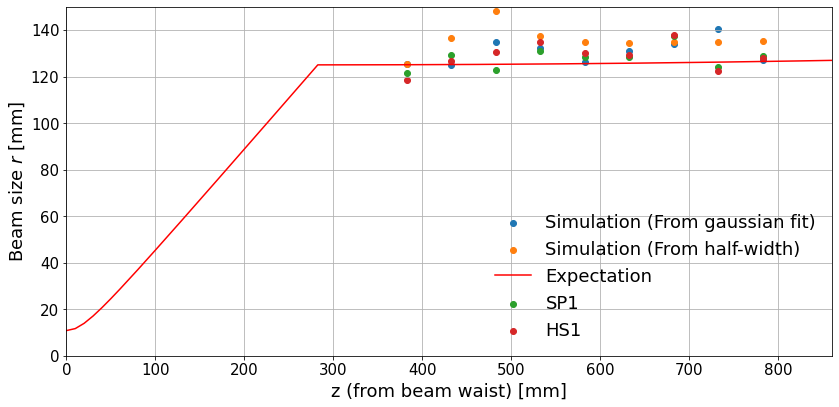

In [136]:
_indir = 'input/CST/20GHz_v6-1/HS2_bi/'
_infile = 'E-field_abs_ave_w-v.txt'
_w_list_mm = np.arange(50, 550, 50)
_w_list= _w_list_mm * mm
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

print(_infile)
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)

### Create slice data list ###
_slicedata_list = []
_newgrid = ( np.linspace(0, 500, 500+1), np.linspace(-500, 500, 500+1) )
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'y', 'val0'], logz=True, 
                     levels=np.power(10., np.linspace(10, 25, 15)/10), 
                     newgrid=_newgrid)
_data_grid['val0'] = _data_grid.pop('z') # key name change: z --> val0
_data_grid['val0'][np.isnan(_data_grid['val0'])] = 0.

for _w in _w_list_mm:
    print(f'w = {_w} mm')
    _slicedata_list.append( getSlice(_data_grid, 'x', _w) )
    pass

### Plot slice data ###
fig, ax = plt.subplots(1, 1, figsize=(9,6))
for _label, _data in zip(_label_list, _slicedata_list):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-300, 300])
ax.set_ylim([0, 100])
#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.legend(frameon=False)
ax.grid(True)
ax.set_xlabel('y (E-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()

### Calculate beam size ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 20
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_ymax = np.where(_y==_ymax)
    _x_ymax = _x[_i_ymax][0]
    print(f'x @ y max = {_x_ymax}')
    #_range_scale = 1.0
    _range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_ymax-_fwhm_from_half*_range_scale, _x_ymax+_fwhm_from_half*_range_scale], xlim=[-D_mirror/mm/2, D_mirror/mm/2])
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass

#plt.scatter(_slicedata_list[-1]['y'], _slicedata_list[-1]['val0'])
#plt.xlim(-100, 50)
#plt.ylim(30, 45)

_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

### Draw beam size ###

# Temporary Expectation
#_z_tmp_list = z_antenna_list
#_beamsize_tmp_list = calc_beamwaist(z=_z_tmp_list+20*mm, w0=w0*1.0, wavelength=wavelength)
# Simulation
_z_list = _w_list + z_mirror

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(z_list/mm, beamsize_list/mm, label='Expectation', c='red')
# SP1
ax.scatter(data_61SP1['z_list']/mm, data_61SP1['beamsize_list']/mm, label='SP1')
# HS1
ax.scatter(data_61HS1['z_list']/mm, data_61HS1['beamsize_list']/mm, label='HS1')

ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm)*1.1)
#ax.set_ylim(bottom=0, top=max(_beamsize_list/mm)*1.1)
ax.set_ylim(bottom=0, top=150)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()

## Store the data ##
data_61HS2 = {'data_list':_data_list, 'slicedata_list':_slicedata_list, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

## Antenna Only v4-1 (Old)

w0.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w0.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w0.dat (type=3D_twovalue)
w20.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w20.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w20.dat (type=3D_twovalue)
w40.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w40.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w40.dat (type=3D_twovalue)
w60.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w60.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w60.dat (type=3D_twovalue)
w100.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w100.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w100.dat (type=3D_twovalue)
w150.dat
input file = input/CST/Circular_v4-1/E-field_abs_ave/w150.dat (type=3D_twovalue)
input file = input/CST/Circular_v4-1/E-field_abs_ave/w150.dat (type=3D

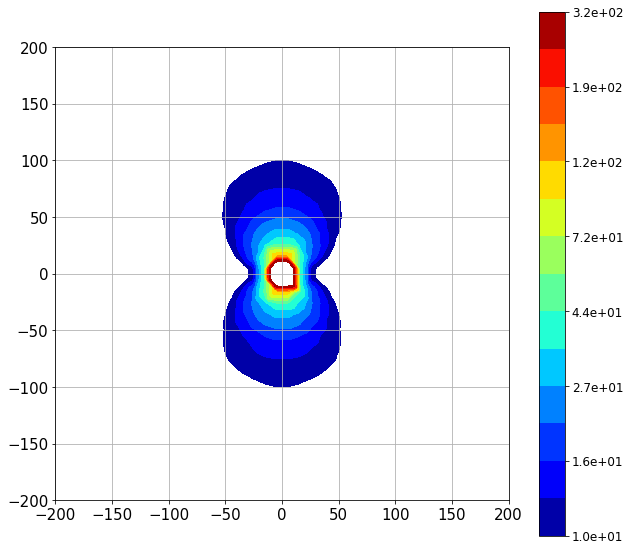

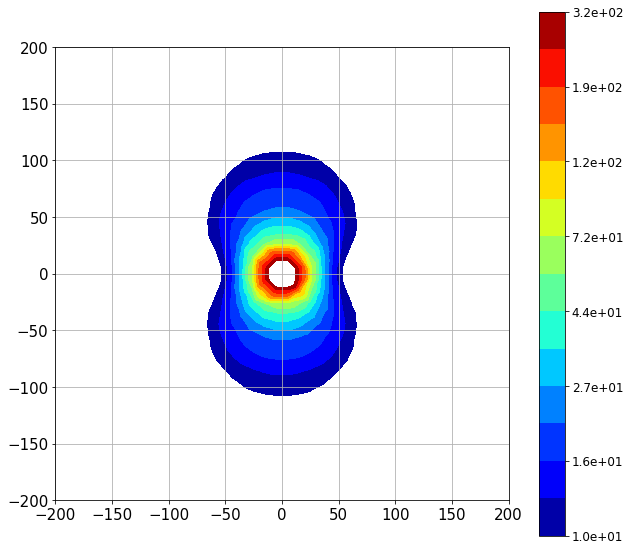

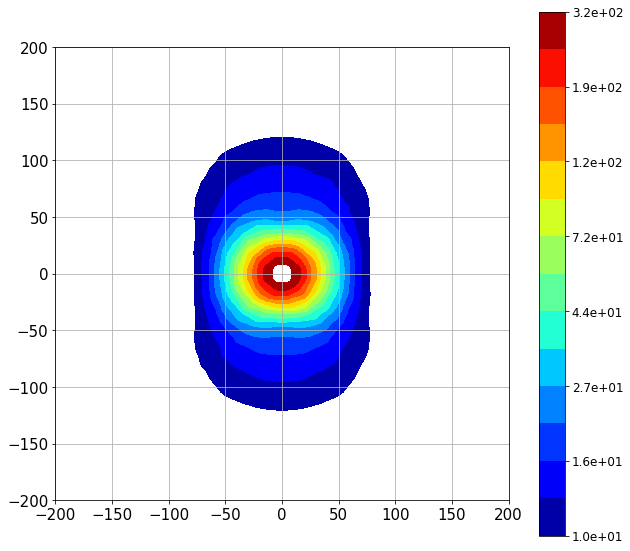

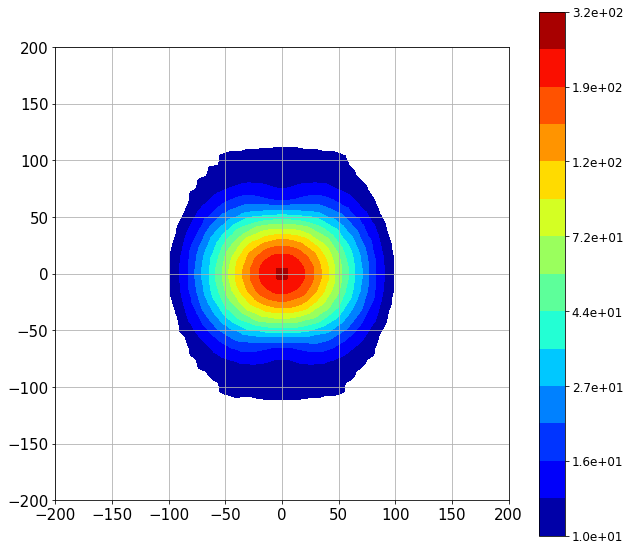

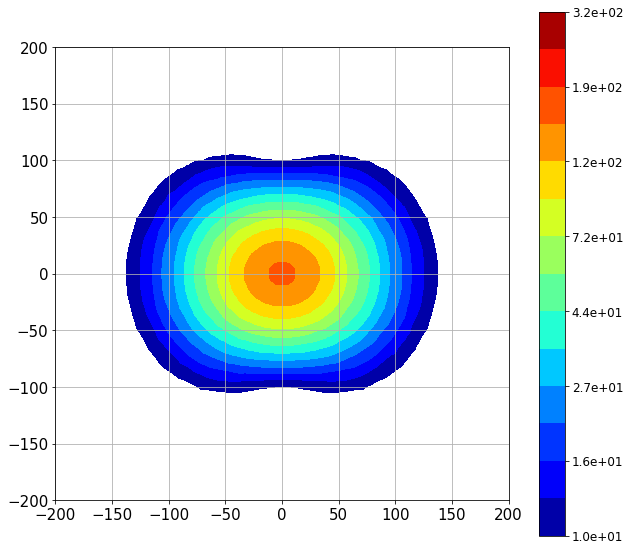

...

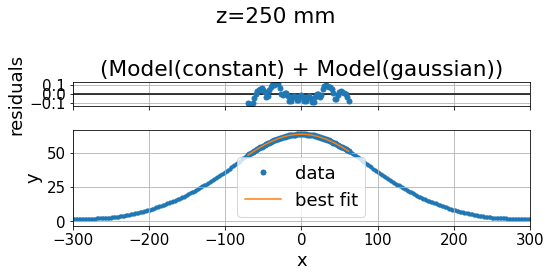

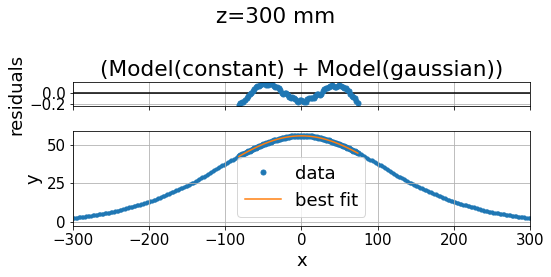

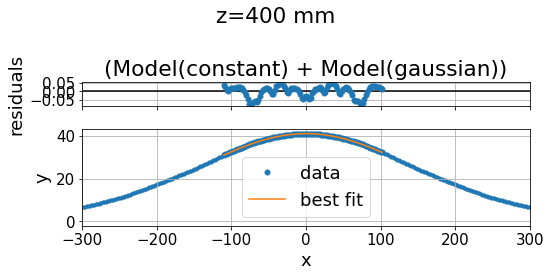

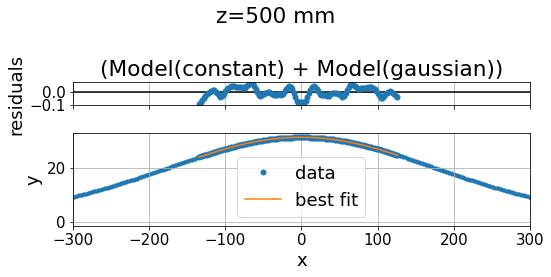

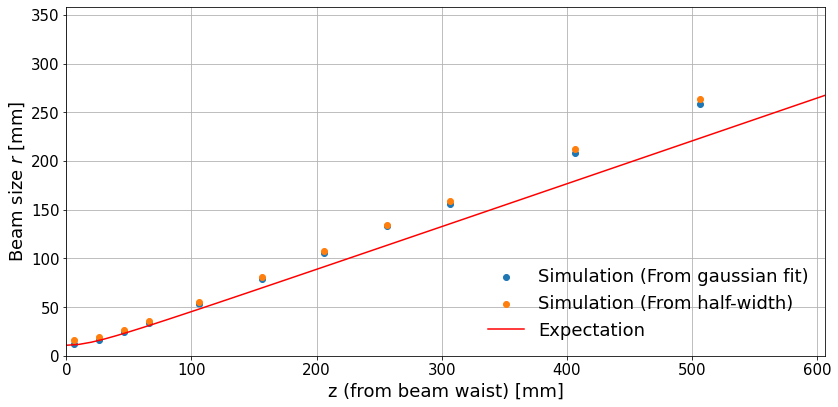

In [98]:
### Get data ###
_indir = 'input/CST/Circular_v4-1/E-field_abs_ave'
_w_list_mm = np.array([0, 20, 40, 60, 100, 150, 200, 250, 300, 400, 500])
_w_list= _w_list_mm * mm
_infile_list = [ f'w{w_mm}.dat' for w_mm in _w_list_mm ]
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

### Slice data ###
_data_list = []
_slicedata_list = []
for _infile in _infile_list:
    print(_infile)
    _data_list.append(read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0))
    #_slicedata_list.append( slice_file(_infile, _indir, 'x', 0.))
    _slicedata_list.append( slice_file(_infile, _indir, 'x', 2.5))
    pass

_slicedata_list2 = []
for i, _label in enumerate(_label_list):
    _newgrid = ( np.linspace(-500, 500, 500+1), np.linspace(-500, 500, 500+1) )
    fig, ax, _data = plot2D_key(_data_list[i], keys=['x', 'y', 'val0'], logz=True, 
                         levels=np.power(10., np.linspace(10, 25, 15)/10), 
                         newgrid=_newgrid)

    xlim = [-200, 200]
    ylim = [-200, 200]
    zlim = [0.1, None]
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    _data['val0'] = _data.pop('z') # key name change: z --> val0
    #print(_data['val0'])
    _data['val0'][np.isnan(_data['val0'])] = 0.
    #print(_data['val0'])
    _slicedata_list2.append( getSlice(_data, 'x', 0.) )
    pass


### Plot sliced data ###
fig, ax = plt.subplots(1, 1, figsize=(12,6))
for _label, _data in zip(_label_list, _slicedata_list2):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-D_mirror/mm/2., D_mirror/mm/2.])
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.grid(True)
ax.set_xlabel('y (E-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
ax.set_yscale('log')
fig.tight_layout()


### Calculate beam size in E-plane ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 10
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list2) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_max = np.where(_y==_ymax)
    _x_max = _x[_i_max][0]
    #_range_scale = 1.0
    _range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_max-_fwhm_from_half*_range_scale, _x_max+_fwhm_from_half*_range_scale], 
                        xlim=[-300, 300], title=_label)
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size in E-plane @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass
_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

### Plot beamsize ###
# Simulation
_z_list = _w_list + d_waist
# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(z_antenna_list/mm, beamsize_antenna_list/mm, label='Expectation', c='red')
#ax.plot(_z_tmp_list/mm, _beamsize_tmp_list/mm, label='Expectation (tmp)')
ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm) + 100)
ax.set_ylim(bottom=0, top=max(_beamsize_list/mm) + 100)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()

### Save the data ###
data_41Antenna = {'data_list':_data_list, 'slicedata_list':_slicedata_list2, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

## Antenna Only v6-1 SP2_AntennaOnly (E-plane)

E-field_abs_ave_w-v.txt
input file = input/CST/20GHz_v6-1/SP2_AntennaOnly//E-field_abs_ave_w-v.txt (type=3D_twovalue)
x_list (size=(501,)) = [  0.   1.   2. ... 498. 499. 500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
w = 0 mm
w = 20 mm
w = 40 mm
w = 60 mm
w = 100 mm
w = 150 mm
w = 200 mm
w = 250 mm
w = 300 mm
w = 400 mm
w = 500 mm


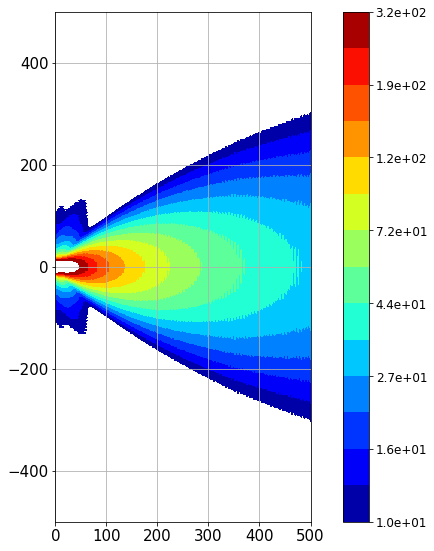

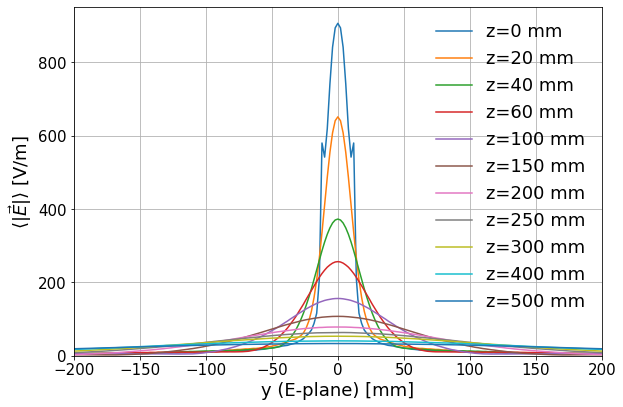

In [113]:
_indir = 'input/CST/20GHz_v6-1/SP2_AntennaOnly/'
_infile = 'E-field_abs_ave_w-v.txt'
#_infile = 'E-field_abs_ave_w-u.txt'
_w_list_mm = np.array([0, 20, 40, 60, 100, 150, 200, 250, 300, 400, 500])
_w_list= _w_list_mm * mm
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

print(_infile)
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)

### Create slice data list ###
_slicedata_list = []
_newgrid = ( np.linspace(0, 500, 500+1), np.linspace(-500, 500, 500+1) )
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'y', 'val0'], logz=True, 
#fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'x', 'val0'], logz=True, 
                     levels=np.power(10., np.linspace(10, 25, 15)/10), 
                     newgrid=_newgrid)
_data_grid['val0'] = _data_grid.pop('z') # key name change: z --> val0
_data_grid['val0'][np.isnan(_data_grid['val0'])] = 0.

for _w in _w_list_mm:
    print(f'w = {_w} mm')
    _slicedata_list.append( getSlice(_data_grid, 'x', _w) )
    pass

### Plot sliced data ###
fig, ax = plt.subplots(1, 1, figsize=(9,6))
for _label, _data in zip(_label_list, _slicedata_list):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-200, 200])
ax.set_ylim(bottom=0)
#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.legend(frameon=False)
ax.grid(True)
ax.set_xlabel('y (E-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()

Beam size in E-plane @ power = 1/e = 13.88 mm / 15.24 mm
Beam size in E-plane @ power = 1/e = 14.76 mm / 14.78 mm
Beam size in E-plane @ power = 1/e = 23.67 mm / 23.67 mm
Beam size in E-plane @ power = 1/e = 33.78 mm / 33.77 mm
Beam size in E-plane @ power = 1/e = 54.62 mm / 54.49 mm
Beam size in E-plane @ power = 1/e = 80.93 mm / 80.66 mm
Beam size in E-plane @ power = 1/e = 108.23 mm / 107.88 mm
Beam size in E-plane @ power = 1/e = 135.27 mm / 135.10 mm
Beam size in E-plane @ power = 1/e = 161.89 mm / 162.29 mm
Beam size in E-plane @ power = 1/e = 215.91 mm / 214.85 mm
Beam size in E-plane @ power = 1/e = 270.37 mm / 270.30 mm


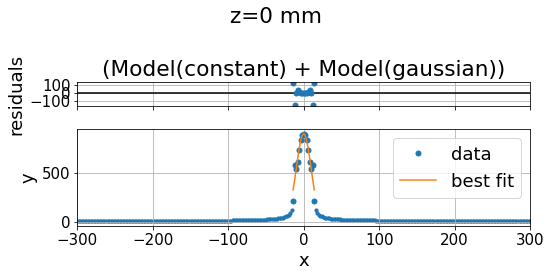

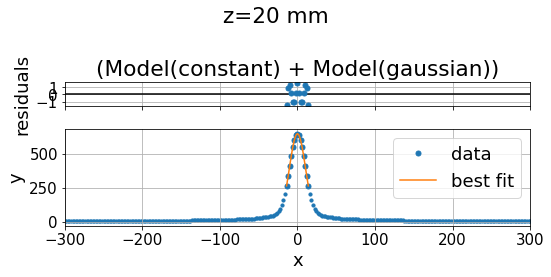

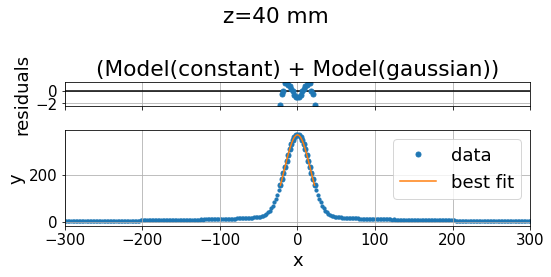

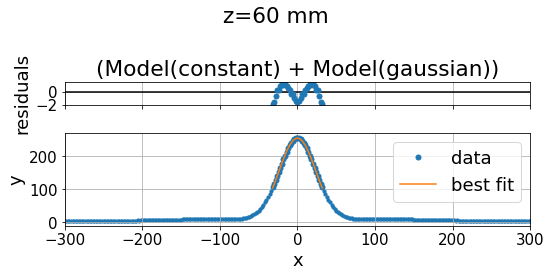

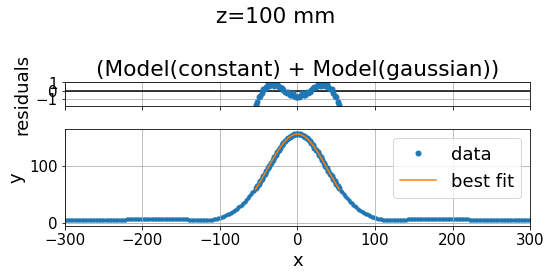

...

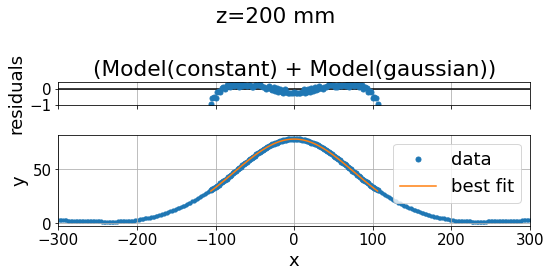

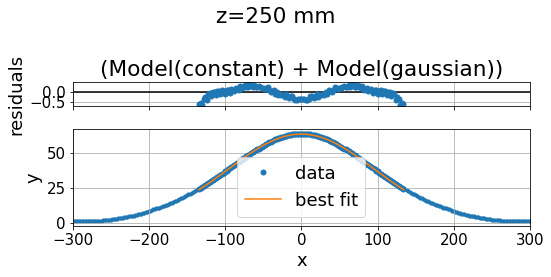

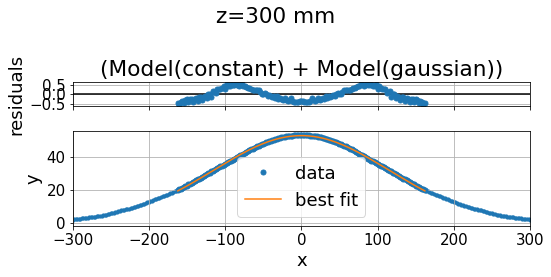

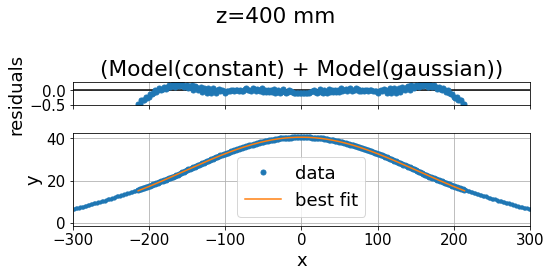

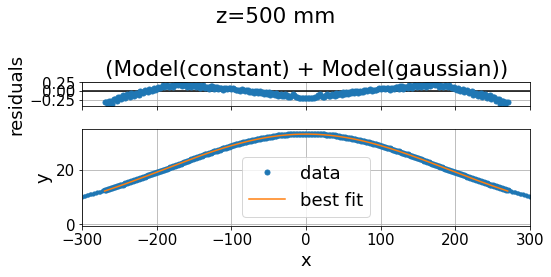

In [114]:
### Calculate beam size in E-plane ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 1
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_max = np.where(_y==_ymax)
    _x_max = _x[_i_max][0]
    _range_scale = 1.0
    #_range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_max-_fwhm_from_half*_range_scale, _x_max+_fwhm_from_half*_range_scale], 
                        xlim=[-300, 300], title=_label)
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size in E-plane @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass
_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

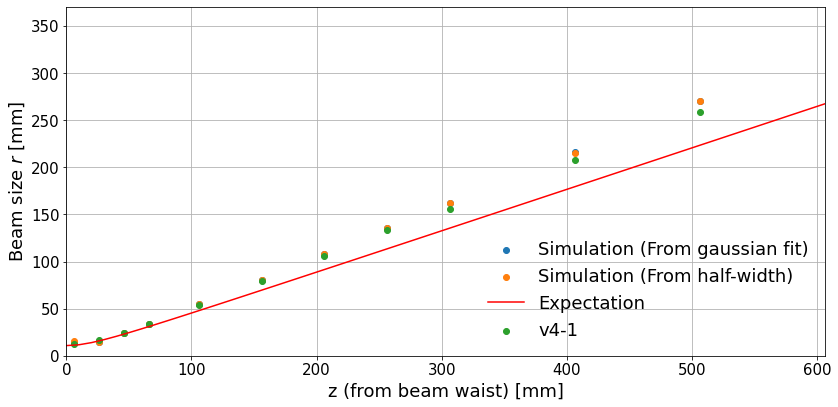

In [115]:
# Simulation
_z_list = _w_list + d_waist

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(z_antenna_list/mm, beamsize_antenna_list/mm, label='Expectation', c='red')
# Old version
ax.scatter(data_41Antenna['z_list']/mm, data_41Antenna['beamsize_list']/mm, label='v4-1')

ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm) + 100)
ax.set_ylim(bottom=0, top=max(_beamsize_list/mm) + 100)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()


### Save the data ###
data_61Antenna = {'data_list':_data_list, 'slicedata_list':_slicedata_list, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

w0 = 8.858466392773169 +- 0.06015039005999249 mm
z0 = -5.717157359562991 +- 1.77089860631782 mm
redchi = 2.941759764640737e-06
success = True
w0 = 8.872713732845412 +- 0.07721486767019846 mm
z0 = -5.692823396037911 +- 2.2700089369868994 mm
redchi = 4.816171329986639e-06
success = True


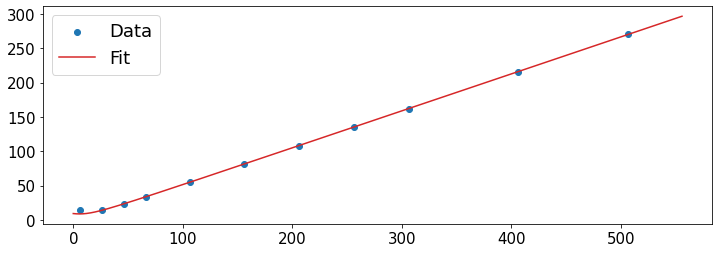

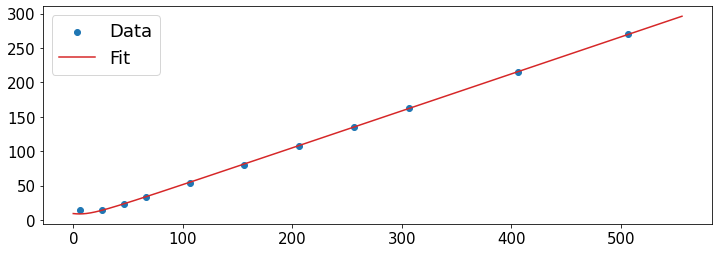

In [116]:
fit_beamsize(_z_list, _beamsize_list, wavelength=wavelength, w0_init=w0)
fit_beamsize(_z_list, _beamsize2_list, wavelength=wavelength, w0_init=w0)

## Antenna Only v6-1 SP2_AntennaOnly (H-plane)

E-field_abs_ave_w-u.txt
input file = input/CST/20GHz_v6-1/SP2_AntennaOnly//E-field_abs_ave_w-u.txt (type=3D_twovalue)
x_list (size=(501,)) = [  0.   1.   2. ... 498. 499. 500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
w = 0 mm
w = 20 mm
w = 40 mm
w = 60 mm
w = 100 mm
w = 150 mm
w = 200 mm
w = 250 mm
w = 300 mm
w = 400 mm
w = 500 mm


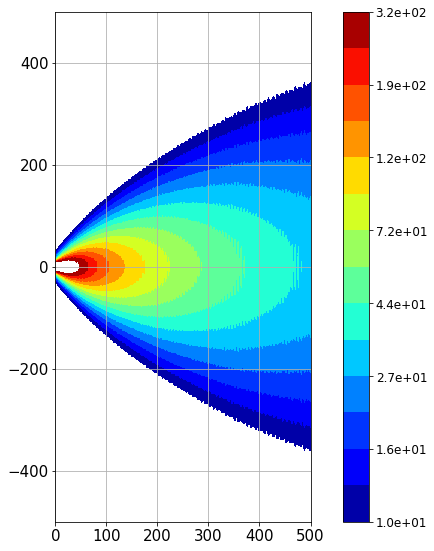

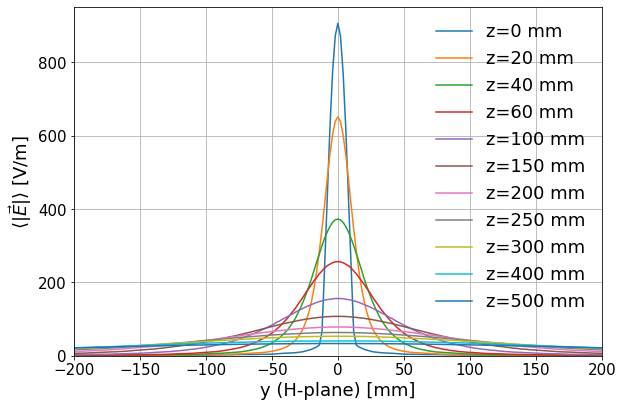

In [117]:
_indir = 'input/CST/20GHz_v6-1/SP2_AntennaOnly/'
_infile = 'E-field_abs_ave_w-u.txt'
_w_list_mm = np.array([0, 20, 40, 60, 100, 150, 200, 250, 300, 400, 500])
_w_list= _w_list_mm * mm
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

print(_infile)
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)

### Create slice data list ###
_slicedata_list = []
_newgrid = ( np.linspace(0, 500, 500+1), np.linspace(-500, 500, 500+1) )
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['z', 'x', 'val0'], logz=True, 
                     levels=np.power(10., np.linspace(10, 25, 15)/10), 
                     newgrid=_newgrid)
_data_grid['val0'] = _data_grid.pop('z') # key name change: z --> val0
_data_grid['val0'][np.isnan(_data_grid['val0'])] = 0.

for _w in _w_list_mm:
    print(f'w = {_w} mm')
    _slicedata_list.append( getSlice(_data_grid, 'x', _w) )
    pass

### Plot sliced data ###
fig, ax = plt.subplots(1, 1, figsize=(9,6))
for _label, _data in zip(_label_list, _slicedata_list):
    ax.plot( _data['y'], _data['val0'], label=_label )
    pass
ax.set_xlim([-200, 200])
ax.set_ylim(bottom=0)
#ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1,1))
ax.legend(frameon=False)
ax.grid(True)
ax.set_xlabel('y (H-plane) [mm]')
ax.set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()

Beam size in H-plane @ power = 1/e = 9.43 mm / 9.38 mm
Beam size in H-plane @ power = 1/e = 15.21 mm / 15.24 mm
Beam size in H-plane @ power = 1/e = 26.80 mm / 26.69 mm
Beam size in H-plane @ power = 1/e = 39.12 mm / 38.93 mm
Beam size in H-plane @ power = 1/e = 63.95 mm / 63.90 mm
Beam size in H-plane @ power = 1/e = 95.17 mm / 94.63 mm
Beam size in H-plane @ power = 1/e = 127.59 mm / 127.51 mm
Beam size in H-plane @ power = 1/e = 159.37 mm / 158.16 mm
Beam size in H-plane @ power = 1/e = 190.37 mm / 188.36 mm
Beam size in H-plane @ power = 1/e = 253.95 mm / 252.84 mm
Beam size in H-plane @ power = 1/e = 313.00 mm / 313.14 mm


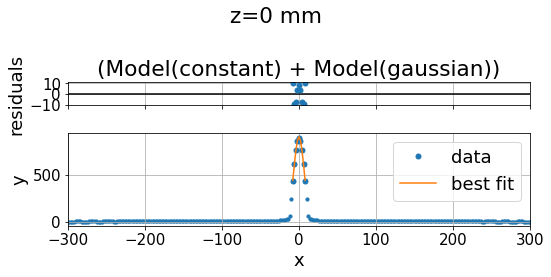

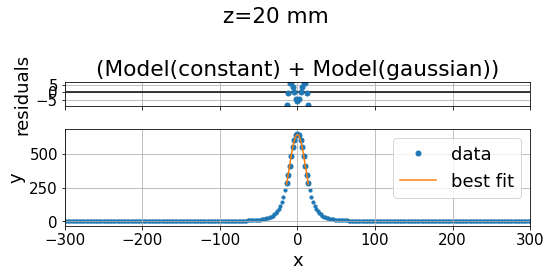

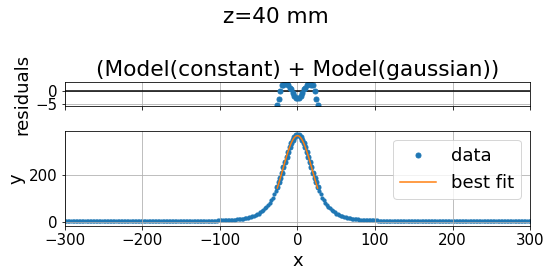

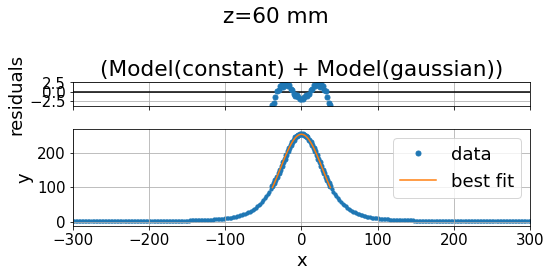

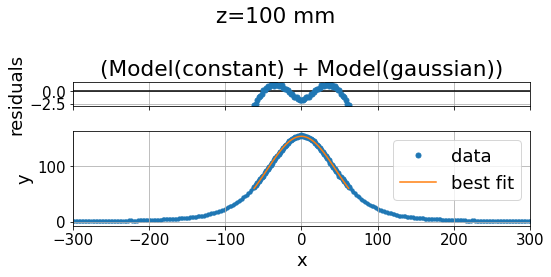

...

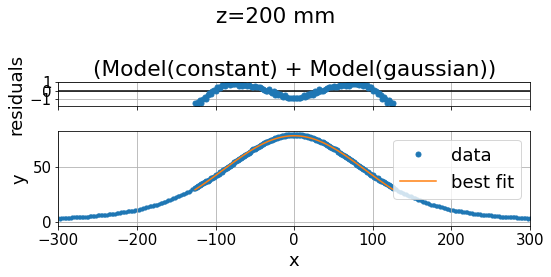

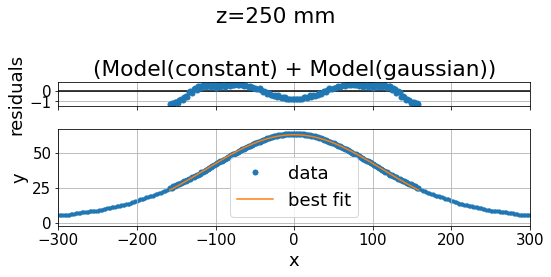

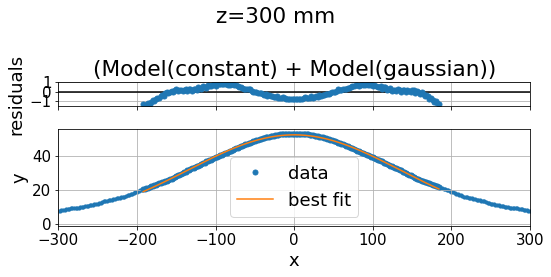

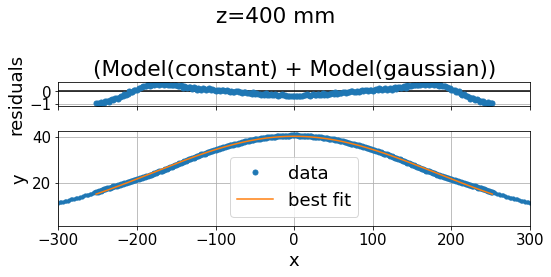

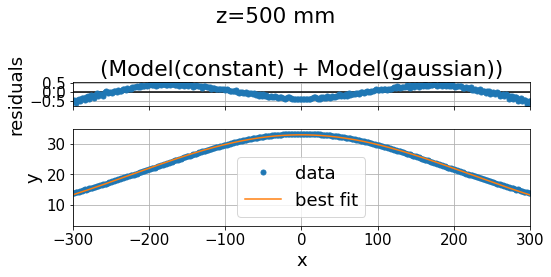

In [118]:
### Calculate beam size in H-plane ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 1
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_max = np.where(_y==_ymax)
    _x_max = _x[_i_max][0]
    _range_scale = 1.0
    #_range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_max-_fwhm_from_half*_range_scale, _x_max+_fwhm_from_half*_range_scale], 
                        xlim=[-300, 300], title=_label)
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size in H-plane @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass
_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

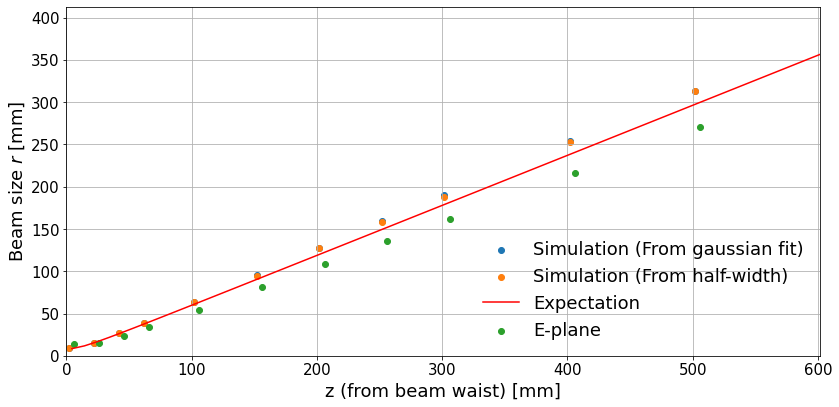

In [120]:
# Simulation
_z_list = _w_list + d_waistH

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation (From gaussian fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation (From half-width)')
ax.plot(zH_antenna_list/mm, beamsizeH_antenna_list/mm, label='Expectation', c='red')
# Old version
ax.scatter(data_61Antenna['z_list']/mm, data_61Antenna['beamsize_list']/mm, label='E-plane')

ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm) + 100)
ax.set_ylim(bottom=0, top=max(_beamsize_list/mm) + 100)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()


### Save the data ###
data_61HAntenna = {'data_list':_data_list, 'slicedata_list':_slicedata_list, 
                  'z_list':_z_list, 'w_list':_w_list, 
                  'beamsize_list':_beamsize_list, 'fitresult_list':_fitresult_list}

w0 = 7.599309132801224 +- 0.0309091567552685 mm
z0 = -0.04350967315061571 +- 1.0510801791092057 mm
redchi = 1.4792733159689534e-06
success = True
w0 = 7.61670567491905 +- 0.024087608684687116 mm
z0 = -0.42478289445679884 +- 0.8170226854441063 mm
redchi = 8.870725400875958e-07
success = True


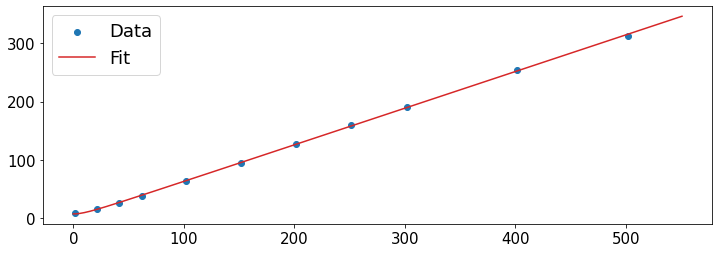

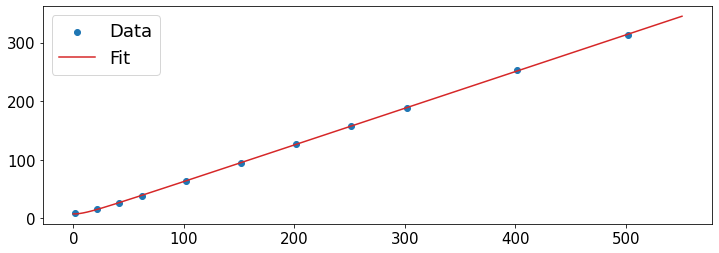

In [121]:
fit_beamsize(_z_list, _beamsize_list, wavelength=wavelength, w0_init=w0)
fit_beamsize(_z_list, _beamsize2_list, wavelength=wavelength, w0_init=w0)

# Obsolete scripts

### Phase check (E-field u-component)

input file = input/CST/v4-1HS2//E-field_u_phase_w200.txt (type=3D_twovalue)
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
input file = input/CST/v4-1HS2//E-field_u_phase_w500.txt (type=3D_twovalue)
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]


Text(0.5, 0.98, 'z from mirror = 500 mm')

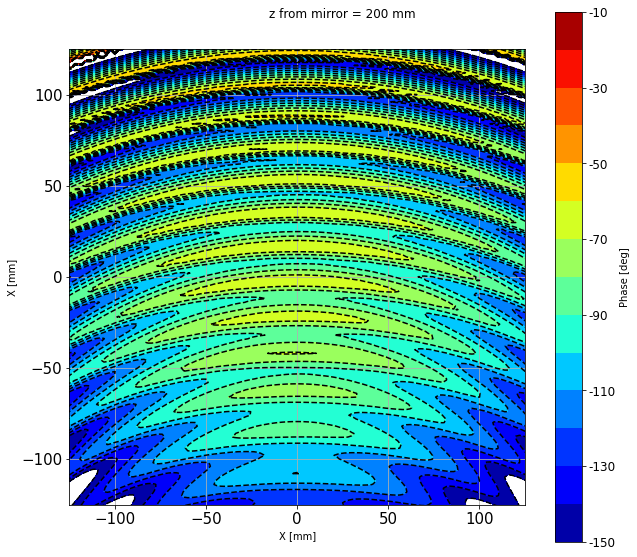

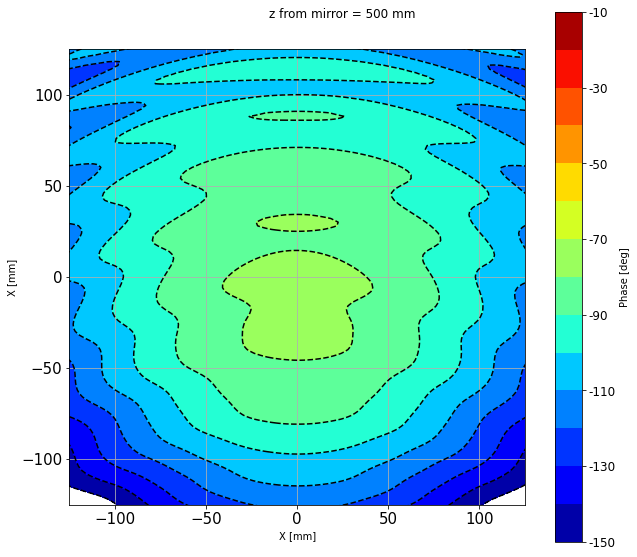

In [28]:
#_contourtype = None
#_levels = np.arange(-180, 180, 30)

#_contourtype = 'line'
_contourtype = 'fill-line'
_levels = np.arange(-150, 0, 10)

_indir = 'input/CST/v4-1HS2/'
_infile = 'E-field_u_phase_w200.txt'
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['x', 'y', 'val0'], logz=False,
                                 contourtype=_contourtype, levels = _levels, colorbarFormat='%.0f',
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel='Phase [deg]')
ax.set_xlim([-125, 125])
ax.set_ylim([-125, 125])
fig.suptitle('z from mirror = 200 mm')
_infile = 'E-field_u_phase_w500.txt'
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['x', 'y', 'val0'], logz=False,
                                 contourtype=_contourtype, levels = _levels, colorbarFormat='%.0f',
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel='Phase [deg]')
ax.set_xlim([-125, 125])
ax.set_ylim([-125, 125])
fig.suptitle('z from mirror = 500 mm')

input file = input/CST/v4-1HS2//E-field_v_phase_w200.txt (type=3D_twovalue)
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]


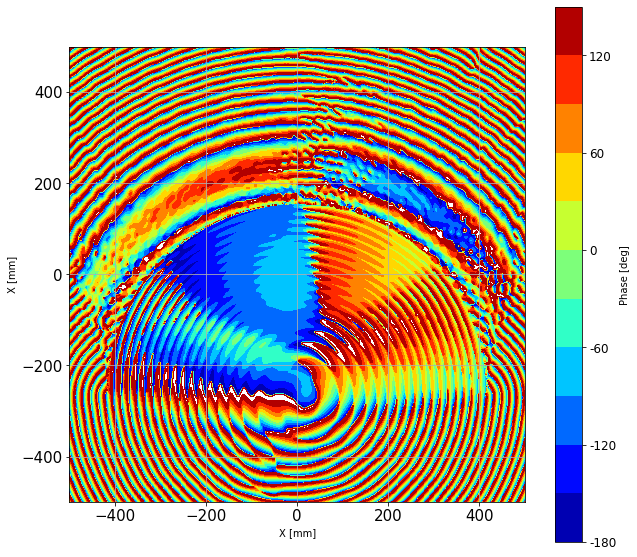

In [29]:
_indir = 'input/CST/v4-1HS2/'
_infile = 'E-field_v_phase_w200.txt'
_raw_data = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)
fig, ax, _data_grid = plot2D_key(_raw_data, keys=['x', 'y', 'val0'], logz=False,
                                 levels = np.arange(-180, 180, 30), colorbarFormat='%.0f',
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel='Phase [deg]')

### Z/Abs check (E-field $|E_w| / |E|$)

input file = input/CST/v4-1HS2//E-field_w_mag_w500.txt (type=3D_twovalue)
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
input file = input/CST/v4-1HS2//E-field_abs_mag_w500.txt (type=3D_twovalue)
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
x_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]
y_list (size=(501,)) = [-500. -498. -496. ...  496.  498.  500.]


(-125.0, 125.0)

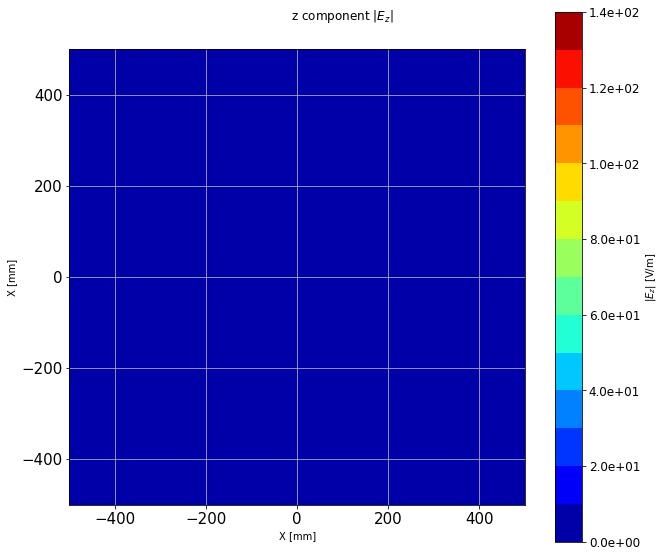

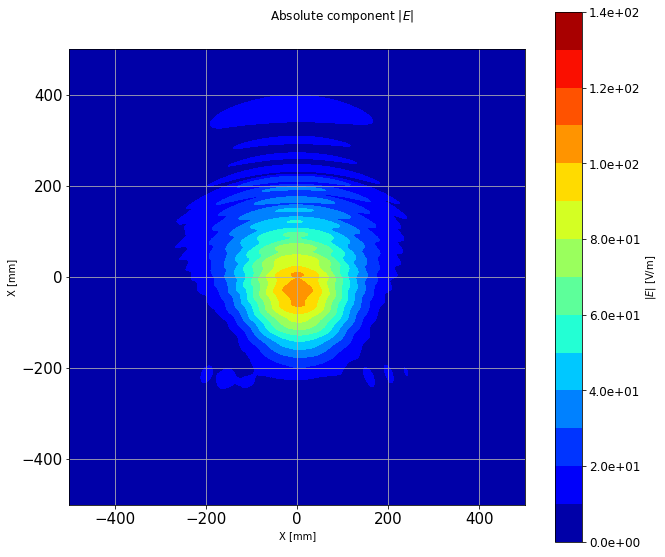

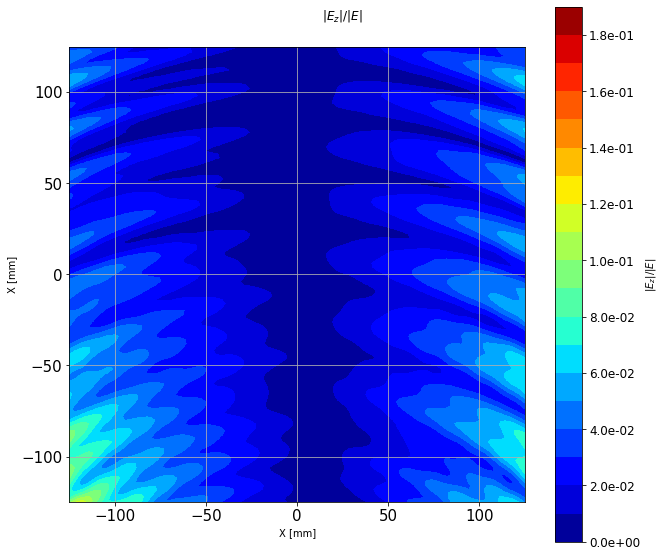

In [30]:
_levels = np.arange(0, 150, 10)

_indir = 'input/CST/v4-1HS2/'
_infile = 'E-field_w_mag_w500.txt'
_raw_data1 = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)
fig, ax, _data_grid = plot2D_key(_raw_data1, keys=['x', 'y', 'val0'], logz=False,
                                 levels = _levels,
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel=r'$|E_z|$ [V/m]')
fig.suptitle(r'z component $|E_z|$')


_indir = 'input/CST/v4-1HS2/'
_infile = 'E-field_abs_mag_w500.txt'
_raw_data2 = read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0)
fig, ax, _data_grid = plot2D_key(_raw_data2, keys=['x', 'y', 'val0'], logz=False,
                                 levels = _levels,
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel=r'$|E|$ [V/m]')
fig.suptitle(r'Absolute component $|E|$')

_data_ratio = _raw_data1
_data_ratio['val0'] = _data_ratio['val0'] / _raw_data2['val0']
fig, ax, _data_grid = plot2D_key(_data_ratio, keys=['x', 'y', 'val0'], logz=False,
                                 levels = np.arange(0, 0.2, 0.01),
                                xlabel='X [mm]', ylabel='Y [mm]', zlabel=r'$|E_z|/|E|$')
fig.suptitle(r'$|E_z| / |E|$')
ax.set_xlim(-125, 125)
ax.set_ylim(-125, 125)

## v4-2 (for sliced 2D data)
- Full simulation

In [34]:
_indir = 'input/CST/v4-2/E-field_abs_ave/'
_w_list_mm = np.array([100, 150, 200, 250, 300, 400, 500])
_w_list= _w_list_mm * mm
_infile_list = [ f'w{w_mm}.txt' for w_mm in _w_list_mm ]
_label_list = [ f'z={_w:.0f} mm' for _w in _w_list_mm ]

_data_list = []
for _infile in _infile_list:
    print(_infile)
    _data_list.append(read_CST(f'{_indir}/{_infile}', '3D_twovalue', verbose=0))
    pass

w100.txt
input file = input/CST/v4-2/E-field_abs_ave//w100.txt (type=3D_twovalue)
w150.txt
input file = input/CST/v4-2/E-field_abs_ave//w150.txt (type=3D_twovalue)
w200.txt
input file = input/CST/v4-2/E-field_abs_ave//w200.txt (type=3D_twovalue)
w250.txt
input file = input/CST/v4-2/E-field_abs_ave//w250.txt (type=3D_twovalue)
w300.txt
input file = input/CST/v4-2/E-field_abs_ave//w300.txt (type=3D_twovalue)
w400.txt
input file = input/CST/v4-2/E-field_abs_ave//w400.txt (type=3D_twovalue)
w500.txt
input file = input/CST/v4-2/E-field_abs_ave//w500.txt (type=3D_twovalue)


x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -28
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -12
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -24
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -20
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -24
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -20
x_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y_list (size=(1001,)) = [-500 -499 -498 ...  498  499  500]
y @ max = -24
Beam size in E-plane @ power = 1/e = 118.71 mm / 115.08 mm
Bea

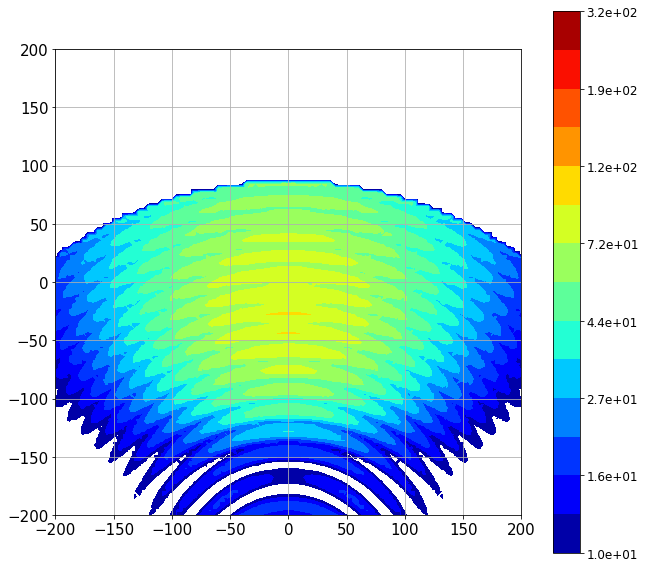

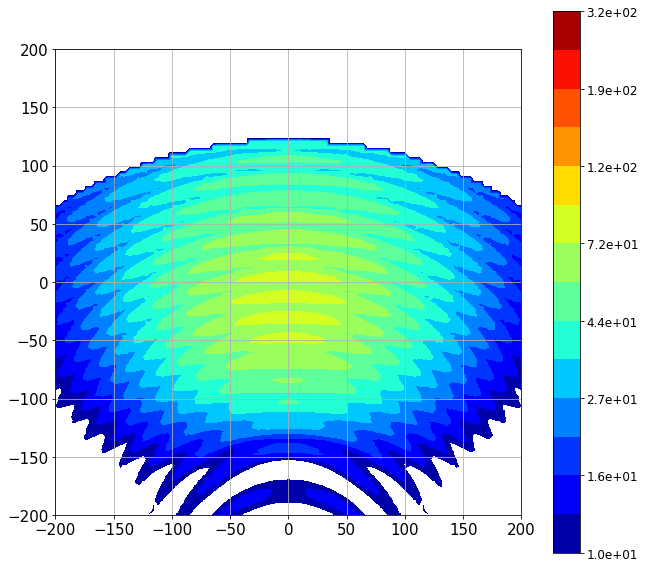

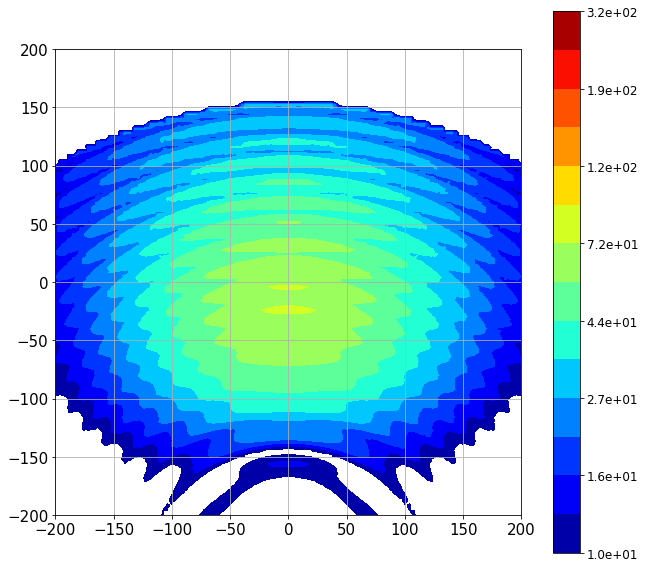

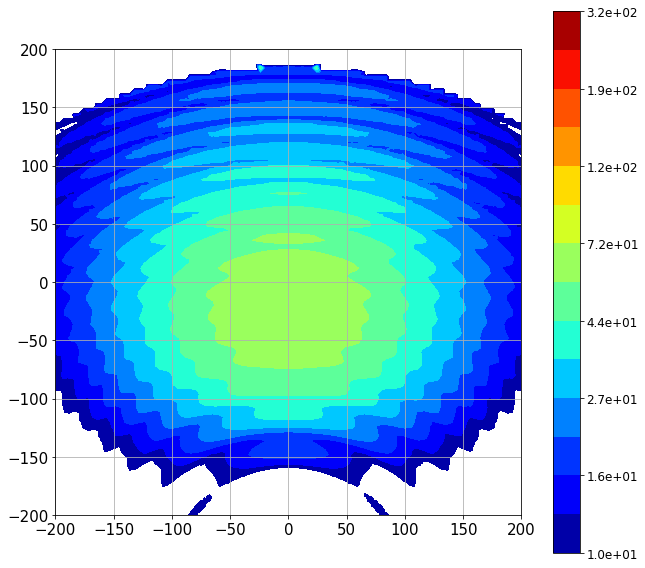

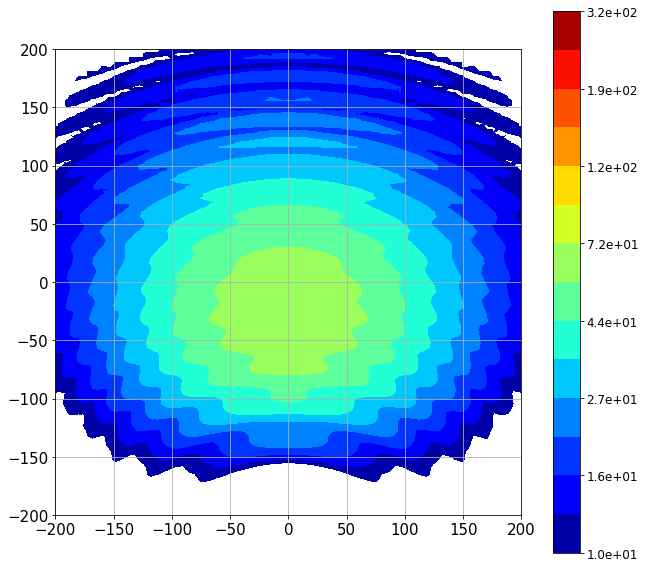

...

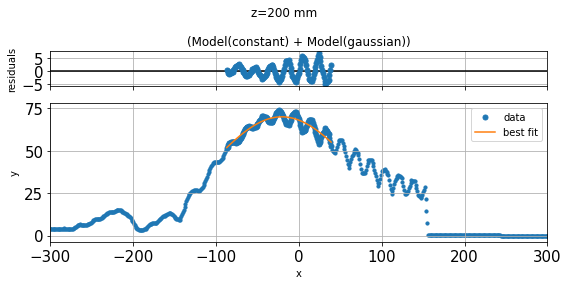

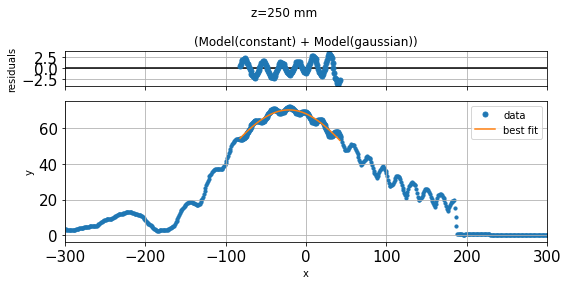

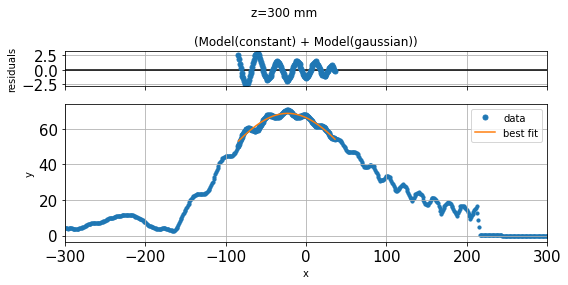

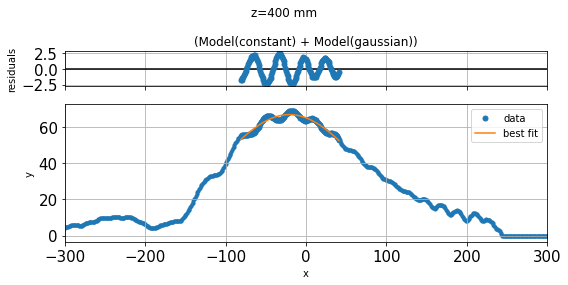

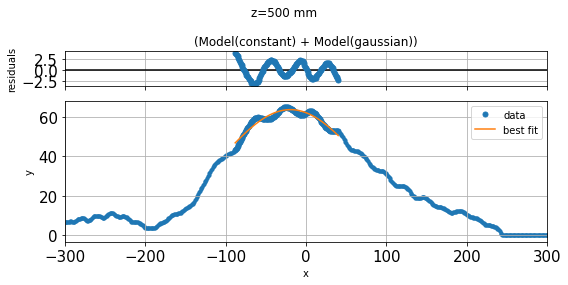

In [35]:
### slice data ###
_slicedata_list = [] # E-plane
_slicedataH_list = [] # H-plane
for i, _label in enumerate(_label_list):
    _newgrid = ( np.arange(-500, 500+1, 1), np.arange(-500, 500+1, 1) )
    nconv2D = None
    #nconv2D = (10, 10)
    fig, ax, _data = plot2D_key(_data_list[i], keys=['x', 'y', 'val0'], logz=True, 
                         levels=np.power(10., np.linspace(10, 25, 15)/10), 
                         newgrid=_newgrid, nconv2D=nconv2D)
    xlim = [-200, 200]
    ylim = [-200, 200]
    zlim = [0.1, None]
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    _data['val0'] = _data.pop('z') # key name change: z --> val0
    _slicedata = getSlice(_data, 'x', 0.)
    _i_max = np.where( _slicedata['val0']==max(_slicedata['val0']) )
    _y_max = _slicedata['y'][_i_max][0]
    print(f'y @ max = {_y_max}')
    _slicedataH = getSlice(_data, 'y', _y_max)
    
    _slicedata_list.append( _slicedata )
    _slicedataH_list.append( _slicedataH )
    pass

fig, ax = plt.subplots(1, 2, figsize=(18,6))
for _label, _data, _dataH in zip(_label_list, _slicedata_list, _slicedataH_list):
    ax[0].plot( _data['y'], _data['val0'], label=_label )
    ax[1].plot( _dataH['x'], _dataH['val0'], label=_label )
    pass
ax[0].set_xlim([-300, 300])
ax[1].set_xlim([-300, 300])
ax[0].legend(frameon=False)
ax[1].legend(frameon=False)
ax[0].grid(True)
ax[1].grid(True)
ax[0].set_xlabel('Y (E-plane) [mm]')
ax[1].set_xlabel('X (H-plane) [mm]')
ax[0].set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
ax[1].set_ylabel(r'$\langle |\vec{E}| \rangle$ [V/m]')
fig.tight_layout()


### Calculate beam size in E-plane ###
_fitresult_list = []
_beamsize_list = []
_beamsize2_list = []
_n_conv = 20
for i, (_label, _data) in enumerate( zip(_label_list, _slicedata_list) ):
    _x = _data['y']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_max = np.where(_y==_ymax)
    _x_max = _x[_i_max][0]
    #_range_scale = 1.0
    _range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_max-_fwhm_from_half*_range_scale, _x_max+_fwhm_from_half*_range_scale], 
                        xlim=[-300, 300], title=_label)
    _fitresult_list.append( _result )
    _beamsize_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size in E-plane @ power = 1/e = {_beamsize_list[-1]/mm:.2f} mm / {_beamsize2_list[-1]/mm:.2f} mm')
    pass
_beamsize_list = np.array(_beamsize_list)
_beamsize2_list = np.array(_beamsize2_list)

Beam size in H-plane @ power = 1/e = 130.46 mm / 129.46 mm
Beam size in H-plane @ power = 1/e = 136.61 mm / 131.89 mm
Beam size in H-plane @ power = 1/e = 140.56 mm / 138.19 mm
Beam size in H-plane @ power = 1/e = 147.99 mm / 145.22 mm
Beam size in H-plane @ power = 1/e = 146.54 mm / 147.55 mm
Beam size in H-plane @ power = 1/e = 148.38 mm / 152.93 mm
Beam size in H-plane @ power = 1/e = 154.58 mm / 158.76 mm


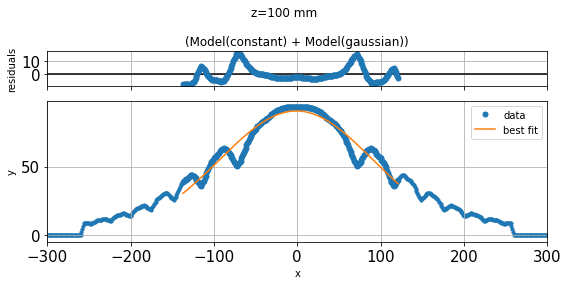

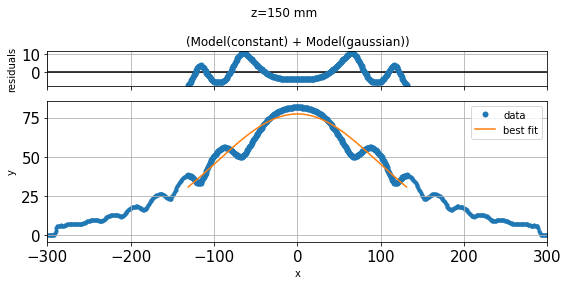

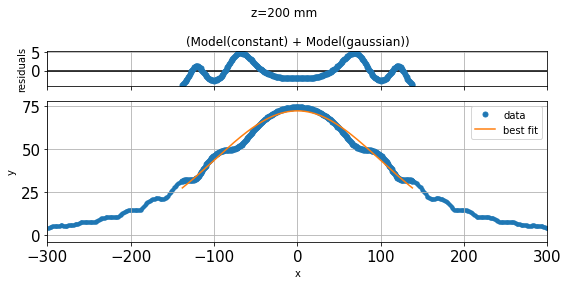

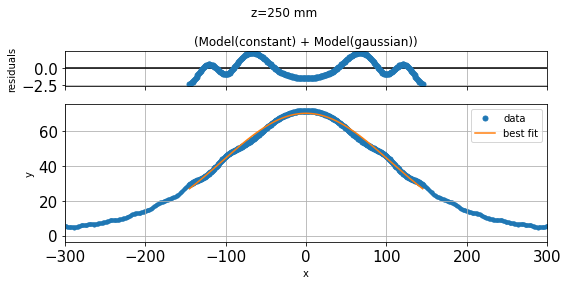

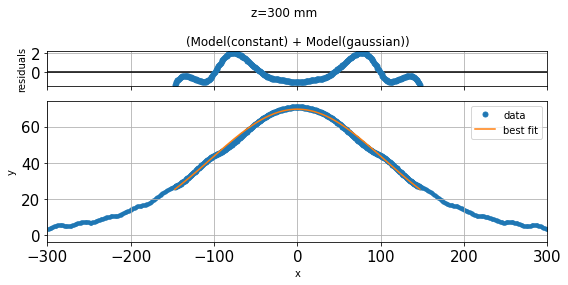

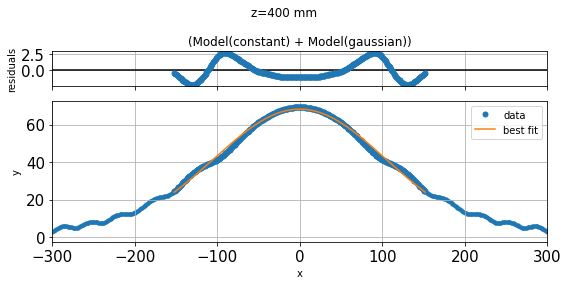

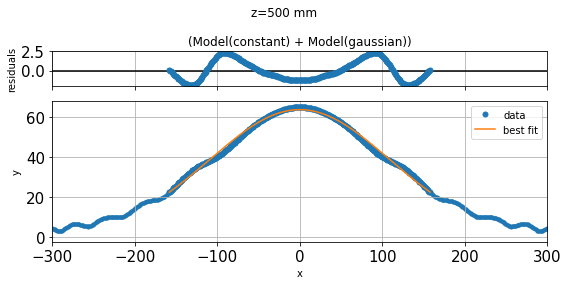

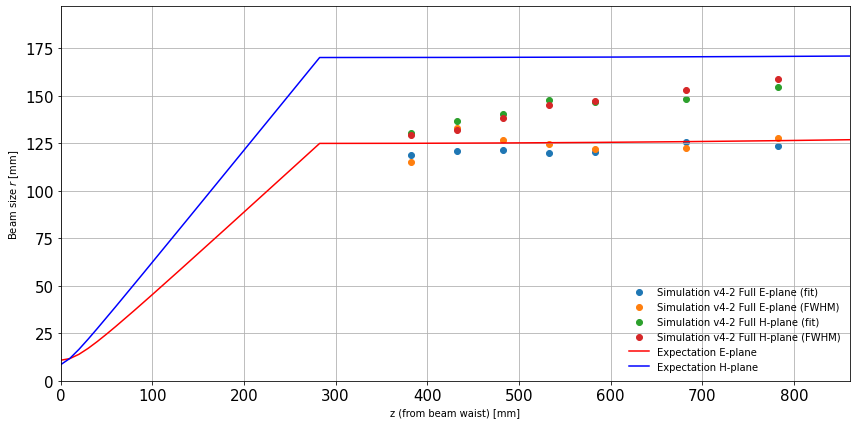

In [36]:
### Calculate beam size in H-plane ###
_fitresultH_list = []
_beamsizeH_list = []
_beamsize2H_list = []
_n_conv = 20
for i, (_label, _data) in enumerate( zip(_label_list, _slicedataH_list) ):
    _x = _data['x']
    _y = _data['val0']
    # get running average
    _b = np.ones(_n_conv)/_n_conv 
    _x_ave = np.convolve(_x, _b, mode="same") 
    _y_ave = np.convolve(_y, _b, mode="same") 
    
    # Get hwhm from half value
    _fwhm_from_half = fwhm_to_beamsize( get_fwhm_from_half(_x_ave, _y_ave) )
    _beamsize2H_list.append( _fwhm_from_half*mm )
    
    _ymax = np.max(_y)
    _i_max = np.where(_y==_ymax)
    _x_max = _x[_i_max][0]
    _range_scale = 1.0
    #_range_scale = 0.5
    _result = gauss_fit(_x, _y, x_fit_range=[_x_max-_fwhm_from_half*_range_scale, _x_max+_fwhm_from_half*_range_scale], 
                        xlim=[-300, 300], title=_label)
    _fitresultH_list.append( _result )
    _beamsizeH_list.append( sigma2beamsize( _result.result.params['sigma'].value )*mm )
    
    print(f'Beam size in H-plane @ power = 1/e = {_beamsizeH_list[-1]/mm:.2f} mm / {_beamsize2H_list[-1]/mm:.2f} mm')
    pass
_beamsizeH_list = np.array(_beamsizeH_list)
_beamsize2H_list = np.array(_beamsize2H_list)

### Draw beam size ###

# Temporary Expectation
#_z_tmp_list = z_antenna_list
#_beamsize_tmp_list = calc_beamwaist(z=_z_tmp_list+20*mm, w0=w0*1.0, wavelength=wavelength)
# Simulation
_z_list = _w_list + z_mirror

# Plot Simulation v.s. Expectation
fig, ax = plt.subplots(1, 1, figsize=(12,6))
ax.scatter(_z_list/mm, _beamsize_list/mm, label='Simulation v4-2 Full E-plane (fit)')
ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation v4-2 Full E-plane (FWHM)')
ax.scatter(_z_list/mm, _beamsizeH_list/mm, label='Simulation v4-2 Full H-plane (fit)')
ax.scatter(_z_list/mm, _beamsize2H_list/mm, label='Simulation v4-2 Full H-plane (FWHM)')
#ax.scatter(_z_list/mm, _beamsize2_list/mm, label='Simulation Hybrid2 (bi) (From half-width)')
#ax.scatter(z_list41HS/mm, beamsize_list41HS/mm, label='Simulation v4-1 HS (uni)')
#ax.scatter(z_list41HS2/mm, beamsize_list41HS2/mm, label='Simulation v4-1 HS (bi)')
#ax.scatter(z_list41/mm, beamsize_list41/mm, label='Simulation v4-1 Full')
ax.plot(z_list/mm, beamsize_list/mm, label='Expectation E-plane', c='red')
ax.plot(z_list/mm, beamsizeH_list/mm, label='Expectation H-plane', c='blue')
#ax.plot(_z_tmp_list/mm, _beamsize_tmp_list/mm, label='Expectation (tmp)')
ax.grid(True)
ax.set_xlabel('z (from beam waist) [mm]')
ax.set_ylabel('Beam size $r$ [mm]')
ax.set_xlim(left=0, right=max(_z_list/mm)*1.1)
ax.set_ylim(bottom=0, top=max(np.hstack([_beamsize_list, _beamsizeH_list, beamsizeH_list, beamsize_list]))/mm*1.1)
#ax.set_yscale('log')
ax.legend(frameon=False, loc='lower right')
fig.tight_layout()

## v4-1 Farfield (Solver Comparison)
- Farfield, Directivity, Phi=90 deg
- v4-1 / v4-1HS / v4-1HS2

In [41]:
_files = [
    'input/CST/v4-1/farfield_directivity_abs_phi90.txt',
    'input/CST/v4-1HS/farfield_directivity_abs_phi90.txt',
    'input/CST/v4-1HS2/farfield_directivity_abs_phi90.txt',
    'input/CST/v4-2HS3/farfield_directivity_abs_phi90.txt',
]
_labels = [
    'Transient',
    'Hybrid Uni-directional',
    'Hybrid Bi-directional',
    'Hybrid v4-2 Bi-directional d=0.01',
]
_xshifts = [90, 0, 0, 0]

_datalist = []
for _file, _xshift in zip(_files, _xshifts):
    _data = read_CST(_file, datatype='farfield1D', verbose=0)
    _angle = _data['angle']
    _angle = (_angle + _xshift + 180)%360 - 180
    _i_sort = np.argsort(_angle)
    _angle = _angle[_i_sort]
    _val = _data['val'][_i_sort]
    
    _data['angle'] = _angle
    _data['val'] = _val
    
    _datalist.append( _data )
    pass

input file = input/CST/v4-1/farfield_directivity_abs_phi90.txt (type=farfield1D)
input file = input/CST/v4-1HS/farfield_directivity_abs_phi90.txt (type=farfield1D)
input file = input/CST/v4-1HS2/farfield_directivity_abs_phi90.txt (type=farfield1D)
input file = input/CST/v4-2HS3/farfield_directivity_abs_phi90.txt (type=farfield1D)


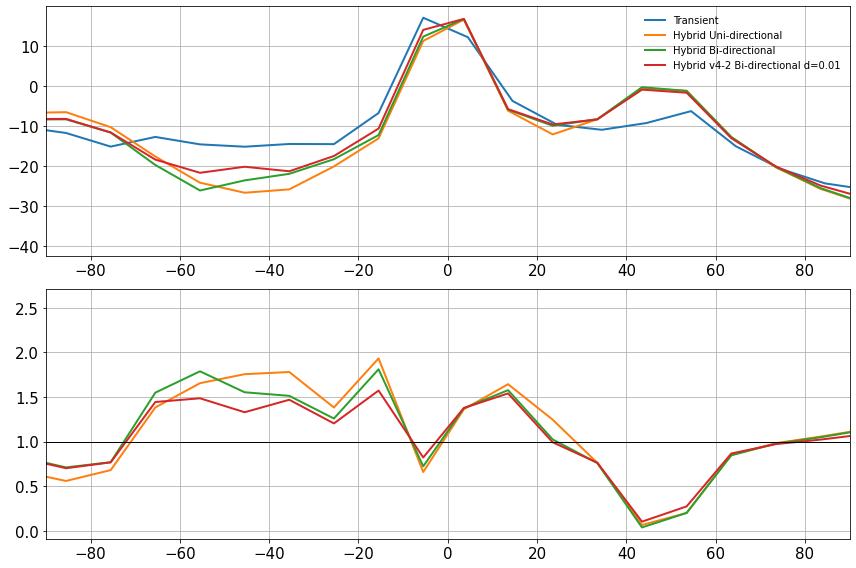

In [42]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
for i, (_data, _label) in enumerate(zip(_datalist, _labels)):
    _x = _data['angle']
    _y = _data['val']
    _x, tmp = func.average_list(_x, 10)
    _y, tmp = func.average_list(_y, 10)
    #sc = ax[0].scatter(_x, _y, label=_label, s=10)
    sc = ax[0].plot(_x, _y, label=_label, lw=2)
    if i == 0:
        _y0 = _y
    else:
        #ax[1].scatter( _x, np.divide(_y, _y0), c=sc.get_ec(), s=10 )
        ax[1].plot( _x, np.divide(_y, _y0), c=sc[0].get_c(), lw=2 )
        pass
    pass
ax[0].legend(frameon=False)
ax[0].grid(True)
ax[1].grid(True)
ax[1].plot([-180,180],[1,1],c='k',lw=1)

ax[0].set_xlim(-90, 90)
ax[1].set_xlim(-90, 90)
fig.tight_layout()

# The End